# TiVo

### Focus
TiVo value propositon and how to measure it

### Qs
- does the study evaluate consumer attitudes well?
- what are strengths/ weaknesses of the present approach?
- would you do anything diff in the market research project? what would you have done and what would you expect to find?
- why segment in the first place? best way?
- how do diff kinds of research relate?

In [1]:
# import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import json
from pandas.io.json import json_normalize
from datetime import datetime
from sklearn import preprocessing

In [77]:
# import and check data
df = pd.read_csv("TiVoData.csv")
df = df.drop(df.index[len(df)-1])
df = df.drop(df.index[len(df)-1])
df = df.drop(df.index[len(df)-1])
dfE = pd.read_csv("TiVoData.csv")
dfE = dfE.drop(dfE.index[len(dfE)-1])
dfE = dfE.drop(dfE.index[len(dfE)-1])
dfE = dfE.drop(dfE.index[len(dfE)-1])
df.head()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,male,married,professional,none,49.0,30.0,Florida,family,mass-consumer electronics,35.0,150.0,13.0,late,2.0,saving favorite shows to watch as a family
1,2.0,male,single,none,none,46.0,36.0,Alabama,single,mass-consumer electronics,35.0,163.0,26.0,late,10.0,saving favorite shows to watch as a family
2,3.0,male,married,professional,BA,58.0,66.0,Massachusetts,family,specialty stores,64.0,103.0,13.0,early,0.0,time shifting
3,4.0,male,married,none,PhD,51.0,78.0,New York,family,mass-consumer electronics,33.0,154.0,22.0,late,5.0,saving favorite shows to watch as a family
4,5.0,female,single,none,none,46.0,52.0,Montana,single,mass-consumer electronics,45.0,161.0,47.0,late,2.0,saving favorite shows to watch as a family


In [3]:
df.describe()

,ID,Annual Income (x1000 $),Age,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),TV Viewing (hours/day)
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,500.500000,39.007000,48.344000,30.962000,94.241000,22.986000,2.370000
std,288.819436,30.985627,17.865409,17.049787,67.173128,13.878776,2.910252
min,1.000000,21.000000,18.000000,7.000000,10.000000,1.000000,0.000000
25%,250.750000,29.000000,32.000000,17.000000,47.000000,11.000000,1.000000
50%,500.500000,33.000000,49.000000,25.500000,73.000000,22.000000,1.000000
75%,750.250000,48.250000,63.000000,42.000000,124.000000,35.000000,2.000000
max,1000.000000,730.000000,80.000000,88.000000,390.000000,48.000000,14.000000


In [4]:
# convert string factors to type: category

dfE["Gender"] = dfE["Gender"].astype("category")
dfE["Marital Status"] = dfE["Marital Status"].astype("category")
dfE["Work Status"] = dfE["Work Status"].astype("category")
dfE["Education"] = dfE["Education"].astype("category")
dfE["Location"] = dfE["Location"].astype("category")
dfE["Purchasing Decision-maker"] = dfE["Purchasing Decision-maker"].astype("category")
dfE["Purchasing Location"] = dfE["Purchasing Location"].astype("category")
dfE["Technology Adoption"] = dfE["Technology Adoption"].astype("category")
dfE["Favorite feature"] = dfE["Favorite feature"].astype("category")
dfE.dtypes

ID                                        float64
Gender                                   category
Marital Status                           category
Work Status                              category
Education                                category
Annual Income (x1000 $)                   float64
Age                                       float64
Location                                 category
Purchasing Decision-maker                category
Purchasing Location                      category
Monthly Electronics Spend                 float64
Monthly Household Spend                   float64
Purchasing Frequency (every x months)     float64
Technology Adoption                      category
TV Viewing (hours/day)                    float64
Favorite feature                         category
dtype: object

In [5]:
# encode qualitative factors

dfE["Gender"] = dfE["Gender"].cat.codes
dfE["Marital Status"] = dfE["Marital Status"].cat.codes
dfE["Work Status"] = dfE["Work Status"].cat.codes
dfE["Education"] = dfE["Education"].cat.codes
dfE["Location"] = dfE["Location"].cat.codes
dfE["Purchasing Decision-maker"] = dfE["Purchasing Decision-maker"].cat.codes
dfE["Purchasing Location"] = dfE["Purchasing Location"].cat.codes
dfE["Technology Adoption"] = dfE["Technology Adoption"].cat.codes
dfE["Favorite feature"] = dfE["Favorite feature"].cat.codes
dfE.head()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,1,0,1,3,49.0,30.0,8,0,1,35.0,150.0,13.0,1,2.0,2
1,2.0,1,1,0,3,46.0,36.0,0,1,1,35.0,163.0,26.0,1,10.0,2
2,3.0,1,0,1,0,58.0,66.0,20,0,3,64.0,103.0,13.0,0,0.0,4
3,4.0,1,0,0,2,51.0,78.0,31,0,1,33.0,154.0,22.0,1,5.0,2
4,5.0,0,1,0,3,46.0,52.0,25,1,1,45.0,161.0,47.0,1,2.0,2


In [6]:
dfE["Purchasing Location"]

0      1
1      1
2      3
3      1
4      1
5      2
6      0
7      2
8      3
9      0
10     0
11     1
12     3
13     0
14     2
15     2
16     0
17     0
18     2
19     2
20     1
21     0
22     1
23     1
24     2
25     0
26     2
27     0
28     1
29     2
      ..
970    1
971    3
972    0
973    0
974    0
975    1
976    1
977    0
978    4
979    0
980    2
981    2
982    2
983    0
984    0
985    0
986    1
987    0
988    1
989    0
990    2
991    0
992    0
993    0
994    3
995    2
996    2
997    0
998    1
999    2
Name: Purchasing Location, Length: 1000, dtype: int8

In [7]:
corr = dfE.corr()**2
corr.style.background_gradient()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
ID,1,0.00302914,0.000882293,0.000252058,0.000467631,0.000113464,0.00172581,3.49515e-08,0.000131947,0.00124222,0.000748799,0.0030112,0.000599197,4.76407e-05,0.000107471,0.00293312
Gender,0.00302914,1,0.0027763,0.0015118,0.00236555,0.00455255,0.00782727,9.48066e-05,0.00176449,0.00531977,0.0142975,0.00574437,0.00806904,0.0042458,0.00303671,2.71814e-05
Marital Status,0.000882293,0.0027763,1,0.0348857,0.00193229,0.00732298,0.0736824,0.00491708,0.204545,0.0161937,0.000588639,0.000160172,0.000484384,0.0401786,0.000321007,0.022505
Work Status,0.000252058,0.0015118,0.0348857,1,0.0438265,0.00941668,0.0221859,0.000394179,0.00713572,0.0809933,0.0880363,0.0516994,0.0290083,0.0247253,0.0035359,0.0166477
Education,0.000467631,0.00236555,0.00193229,0.0438265,1,0.0267965,0.0119058,1.02371e-05,0.00876725,0.0856413,0.224651,0.113098,0.016754,0.0198437,0.0370018,0.00543654
Annual Income (x1000 $),0.000113464,0.00455255,0.00732298,0.00941668,0.0267965,1,0.017547,0.000218568,0.0309623,0.0313905,0.130332,0.066145,0.0159675,0.0215274,0.00711243,7.23509e-05
Age,0.00172581,0.00782727,0.0736824,0.0221859,0.0119058,0.017547,1,0.000824952,0.050322,0.0152026,0.00201247,0.000158404,1.67086e-06,0.0208841,0.00129241,0.0223655
Location,3.49515e-08,9.48066e-05,0.00491708,0.000394179,1.02371e-05,0.000218568,0.000824952,1,0.0108811,0.00203894,0.0007012,0.00189597,0.000826076,0.00361438,0.000394967,0.000129982
Purchasing Decision-maker,0.000131947,0.00176449,0.204545,0.00713572,0.00876725,0.0309623,0.050322,0.0108811,1,4.07798e-06,0.048467,0.0292112,0.0007707,0.117289,0.0174618,0.0143076
Purchasing Location,0.00124222,0.00531977,0.0161937,0.0809933,0.0856413,0.0313905,0.0152026,0.00203894,4.07798e-06,1,0.228505,0.135314,0.076645,0.0385353,0.00908471,0.0011418


In [8]:
df.head()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,male,married,professional,none,49.0,30.0,Florida,family,mass-consumer electronics,35.0,150.0,13.0,late,2.0,saving favorite shows to watch as a family
1,2.0,male,single,none,none,46.0,36.0,Alabama,single,mass-consumer electronics,35.0,163.0,26.0,late,10.0,saving favorite shows to watch as a family
2,3.0,male,married,professional,BA,58.0,66.0,Massachusetts,family,specialty stores,64.0,103.0,13.0,early,0.0,time shifting
3,4.0,male,married,none,PhD,51.0,78.0,New York,family,mass-consumer electronics,33.0,154.0,22.0,late,5.0,saving favorite shows to watch as a family
4,5.0,female,single,none,none,46.0,52.0,Montana,single,mass-consumer electronics,45.0,161.0,47.0,late,2.0,saving favorite shows to watch as a family


In [9]:
df.dtypes

ID                                       float64
Gender                                    object
Marital Status                            object
Work Status                               object
Education                                 object
Annual Income (x1000 $)                  float64
Age                                      float64
Location                                  object
Purchasing Decision-maker                 object
Purchasing Location                       object
Monthly Electronics Spend                float64
Monthly Household Spend                  float64
Purchasing Frequency (every x months)    float64
Technology Adoption                       object
TV Viewing (hours/day)                   float64
Favorite feature                          object
dtype: object

In [10]:
#### Age and TV Viewing analysis

print("Young + Light")
yl= df.loc[(df["Age"] <= 30) & (df["TV Viewing (hours/day)"] <= 2)]
print("% of market size: ", round(len(yl)/len(df),2))
print("most appealing feature: ", yl["Favorite feature"].mode()[0])
print("avg annual income: ", round(yl["Annual Income (x1000 $)"].mean(),2))
print("purchasing decision maker: ", yl["Purchasing Decision-maker"].mode()[0])
print("monthly electronics spend: ", round(yl["Monthly Electronics Spend"].mean(),2))
print("tech adoption: ", yl["Technology Adoption"].mode()[0])
print("stores shopped for electronics: ", yl["Purchasing Location"].mode()[0])

print("____")

print("Old + Light")
ol= df.loc[(df["Age"] > 30) & (df["TV Viewing (hours/day)"] <= 2)]
print("% of market size: ", round(len(ol)/len(df),2))
print("most appealing feature: ", ol["Favorite feature"].mode()[0])
print("avg annual income: ", round(ol["Annual Income (x1000 $)"].mean(),2))
print("purchasing decision maker: ", ol["Purchasing Decision-maker"].mode()[0])
print("monthly electronics spend: ", round(ol["Monthly Electronics Spend"].mean(),2))
print("tech adoption: ", ol["Technology Adoption"].mode()[0])
print("stores shopped for electronics: ", ol["Purchasing Location"].mode()[0])

print("____")

print("Young + Heavy")
yh= df.loc[(df["Age"] <= 30) & (df["TV Viewing (hours/day)"] > 2)]
print("% of market size: ", round(len(yh)/len(df),2))
print("most appealing feature: ", yh["Favorite feature"].mode()[0])
print("avg annual income: ", round(yh["Annual Income (x1000 $)"].mean(),2))
print("purchasing decision maker: ", yh["Purchasing Decision-maker"].mode()[0])
print("monthly electronics spend: ", round(yh["Monthly Electronics Spend"].mean(),2))
print("tech adoption: ", yh["Technology Adoption"].mode()[0])
print("stores shopped for electronics: ", yh["Purchasing Location"].mode()[0])

print("____")

print("Old + Heavy")
oh= df.loc[(df["Age"] > 30) & (df["TV Viewing (hours/day)"] > 2)]
print("% of market size: ", round(len(oh)/len(df),2))
print("most appealing feature: ", oh["Favorite feature"].mode()[0])
print("avg annual income: ", round(oh["Annual Income (x1000 $)"].mean(),2))
print("purchasing decision maker: ", oh["Purchasing Decision-maker"].mode()[0])
print("monthly electronics spend: ", round(oh["Monthly Electronics Spend"].mean(),2))
print("tech adoption: ", oh["Technology Adoption"].mode()[0])
print("stores shopped for electronics: ", oh["Purchasing Location"].mode()[0])


Young + Light
% of market size:  0.14
most appealing feature:  programming/interactive features
avg annual income:  34.04
purchasing decision maker:  single
monthly electronics spend:  30.88
tech adoption:  early
stores shopped for electronics:  discount
____
Old + Light
% of market size:  0.63
most appealing feature:  schedule control
avg annual income:  39.03
purchasing decision maker:  family
monthly electronics spend:  28.05
tech adoption:  early
stores shopped for electronics:  retail
____
Young + Heavy
% of market size:  0.09
most appealing feature:  programming/interactive features
avg annual income:  31.91
purchasing decision maker:  single
monthly electronics spend:  34.6
tech adoption:  early
stores shopped for electronics:  retail
____
Old + Heavy
% of market size:  0.14
most appealing feature:  saving favorite shows to watch as a family
avg annual income:  48.13
purchasing decision maker:  family
monthly electronics spend:  41.73
tech adoption:  late
stores shopped for elec

In [11]:
#### Age and TV Viewing analysis
print(yl['Favorite feature'].value_counts()/yl['Favorite feature'].count())

print(ol['Favorite feature'].value_counts()/ol['Favorite feature'].count())

print(yh['Favorite feature'].value_counts()/yh['Favorite feature'].count())

print(oh['Favorite feature'].value_counts()/oh['Favorite feature'].count())

programming/interactive features              0.379562
cool gadget                                   0.240876
time shifting                                 0.204380
schedule control                              0.167883
saving favorite shows to watch as a family    0.007299
Name: Favorite feature, dtype: float64
schedule control                              0.313291
cool gadget                                   0.308544
time shifting                                 0.305380
saving favorite shows to watch as a family    0.072785
Name: Favorite feature, dtype: float64
programming/interactive features              0.876404
saving favorite shows to watch as a family    0.123596
Name: Favorite feature, dtype: float64
saving favorite shows to watch as a family    1.0
Name: Favorite feature, dtype: float64


In [12]:
#### Age and TV Viewing analysis
print(yl['Purchasing Decision-maker'].value_counts()/yl['Purchasing Decision-maker'].count())

print(ol['Purchasing Decision-maker'].value_counts()/ol['Purchasing Decision-maker'].count())

print(yh['Purchasing Decision-maker'].value_counts()/yh['Purchasing Decision-maker'].count())

print(oh['Purchasing Decision-maker'].value_counts()/oh['Purchasing Decision-maker'].count())

single    0.635036
family    0.364964
Name: Purchasing Decision-maker, dtype: float64
family    0.59019
single    0.40981
Name: Purchasing Decision-maker, dtype: float64
single    0.910112
family    0.089888
Name: Purchasing Decision-maker, dtype: float64
family    0.908451
single    0.091549
Name: Purchasing Decision-maker, dtype: float64


In [13]:
#### Age and TV Viewing analysis
print(yl['Favorite feature'].value_counts()/yl['Favorite feature'].count())

print(ol['Favorite feature'].value_counts()/ol['Favorite feature'].count())

print(yh['Favorite feature'].value_counts()/yh['Favorite feature'].count())

print(oh['Favorite feature'].value_counts()/oh['Favorite feature'].count())

programming/interactive features              0.379562
cool gadget                                   0.240876
time shifting                                 0.204380
schedule control                              0.167883
saving favorite shows to watch as a family    0.007299
Name: Favorite feature, dtype: float64
schedule control                              0.313291
cool gadget                                   0.308544
time shifting                                 0.305380
saving favorite shows to watch as a family    0.072785
Name: Favorite feature, dtype: float64
programming/interactive features              0.876404
saving favorite shows to watch as a family    0.123596
Name: Favorite feature, dtype: float64
saving favorite shows to watch as a family    1.0
Name: Favorite feature, dtype: float64


In [14]:
#### Age and TV Viewing analysis
print(round(np.std(yl['Monthly Electronics Spend']),2))

print(round(np.std(ol['Monthly Electronics Spend']),2))

print(round(np.std(yh['Monthly Electronics Spend']),2))

print(round(np.std(oh['Monthly Electronics Spend']),2))

15.54
18.99
4.68
5.63


In [15]:
#### Age and TV Viewing analysis
print(yl['Technology Adoption'].value_counts()/yl['Technology Adoption'].count())

print(ol['Technology Adoption'].value_counts()/ol['Technology Adoption'].count())

print(yh['Technology Adoption'].value_counts()/yh['Technology Adoption'].count())

print(oh['Technology Adoption'].value_counts()/oh['Technology Adoption'].count())

early    0.992701
late     0.007299
Name: Technology Adoption, dtype: float64
early    0.927215
late     0.072785
Name: Technology Adoption, dtype: float64
early    0.876404
late     0.123596
Name: Technology Adoption, dtype: float64
late    1.0
Name: Technology Adoption, dtype: float64


In [16]:
#### Age and TV Viewing analysis
print(yl['Purchasing Location'].value_counts()/yl['Purchasing Location'].count())

print(ol['Purchasing Location'].value_counts()/ol['Purchasing Location'].count())

print(yh['Purchasing Location'].value_counts()/yh['Purchasing Location'].count())

print(oh['Purchasing Location'].value_counts()/oh['Purchasing Location'].count())

discount                     0.394161
retail                       0.299270
specialty stores             0.197080
web (ebay)                   0.102190
mass-consumer electronics    0.007299
Name: Purchasing Location, dtype: float64
retail                       0.352848
discount                     0.348101
specialty stores             0.226266
mass-consumer electronics    0.072785
Name: Purchasing Location, dtype: float64
retail                       0.337079
web (ebay)                   0.325843
discount                     0.213483
mass-consumer electronics    0.123596
Name: Purchasing Location, dtype: float64
mass-consumer electronics    1.0
Name: Purchasing Location, dtype: float64


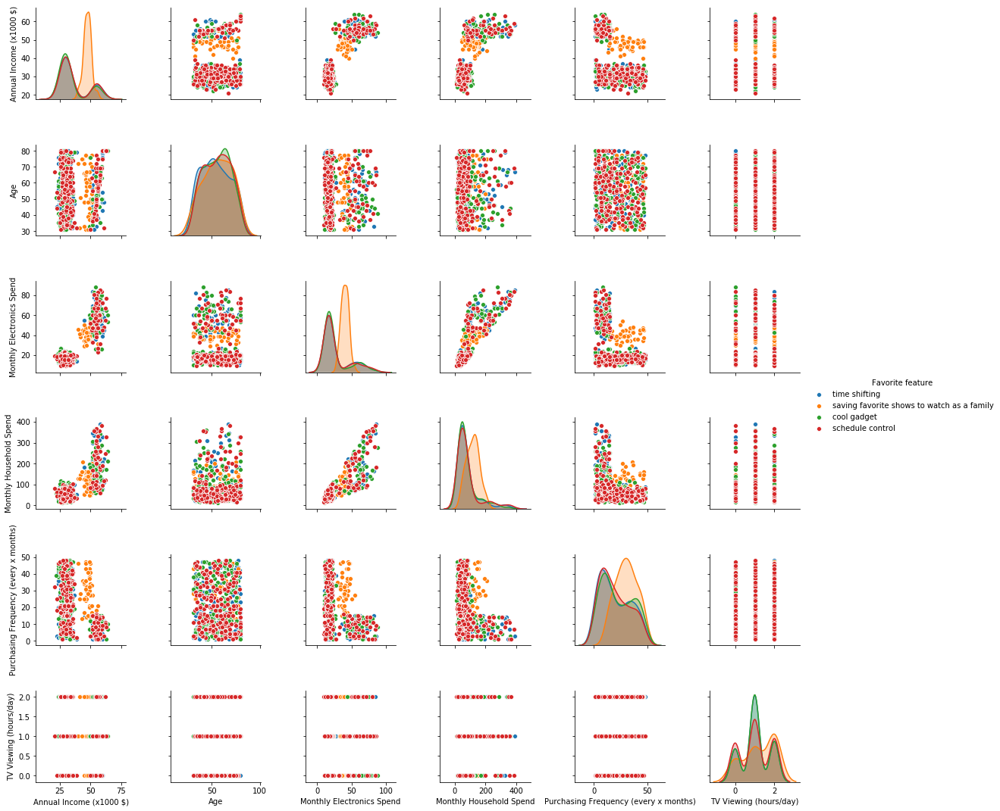

In [17]:
ol[ol["Annual Income (x1000 $)"] >500]


ol = ol[ol["Annual Income (x1000 $)"] < 500]


sb.pairplot(ol.loc[:, df.columns != 'ID'],hue = "Favorite feature")

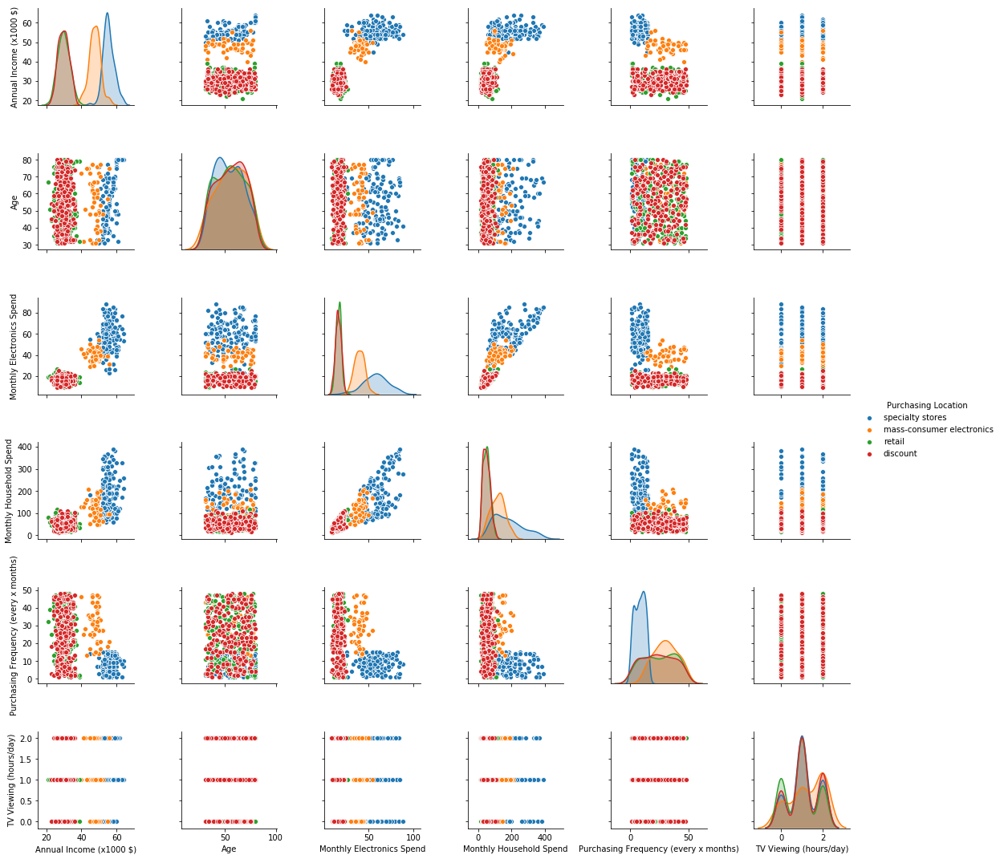

In [18]:
ol[ol["Annual Income (x1000 $)"] >500]


ol = ol[ol["Annual Income (x1000 $)"] < 500]


sb.pairplot(ol.loc[:, df.columns != 'ID'],hue = "Purchasing Location")

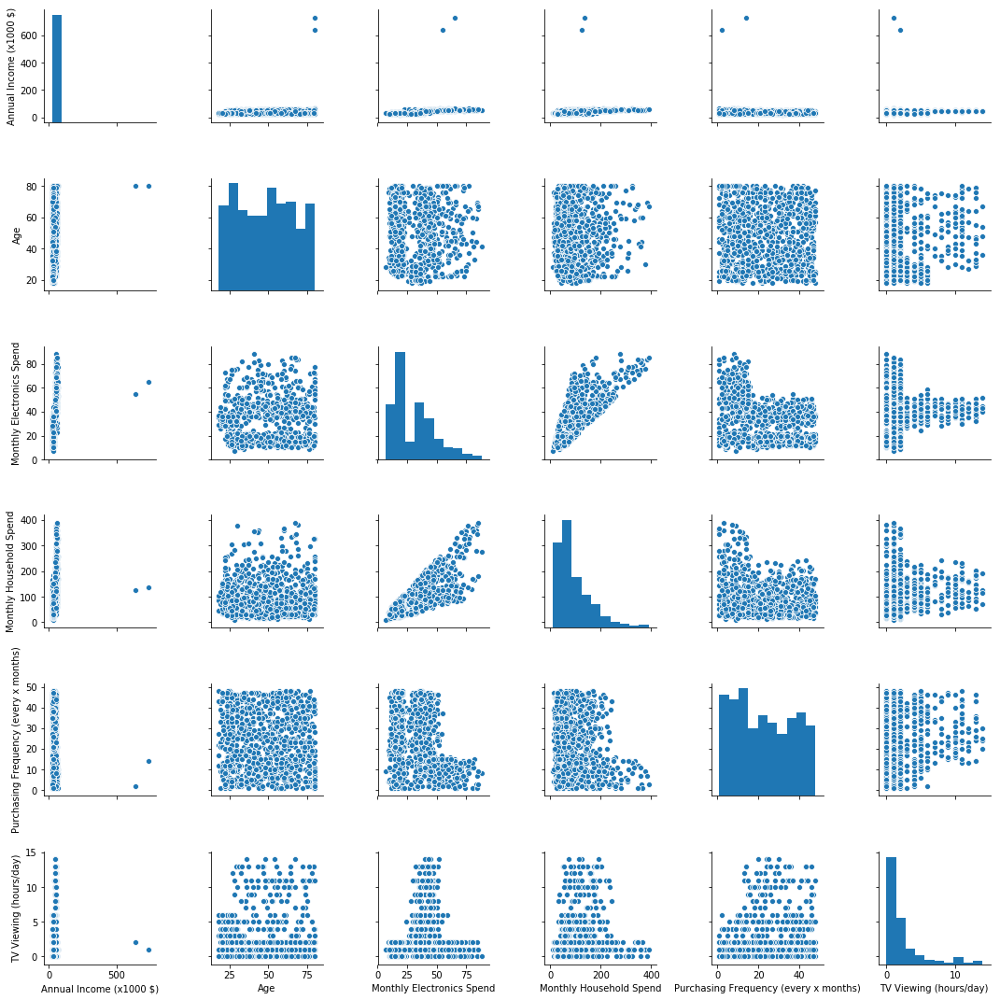

In [19]:
import seaborn as sb

sb.pairplot(df.loc[:, df.columns != 'ID'])

### observations

Annual income has 2 giant outliers

monthly electronics spend and monthly household spend sooo correlated
tv viewing high mode near 0 (v right skewed
monthly electronics spend more left skewed
)

In [20]:
# remove outliers in annual income

dfE[dfE["Annual Income (x1000 $)"] >500]

dfT = dfE.drop(dfE.index[440])
dfT = dfT.drop(dfT.index[921])

print(dfT.loc[[921]])

        ID  Gender  Marital Status  Work Status  Education  \
921  922.0       1               1            1          1   

     Annual Income (x1000 $)   Age  Location  Purchasing Decision-maker  \
921                     27.0  20.0        27                          1   

     Purchasing Location  Monthly Electronics Spend  Monthly Household Spend  \
921                    4                       32.0                     78.0   

     Purchasing Frequency (every x months)  Technology Adoption  \
921                                    9.0                    0   

     TV Viewing (hours/day)  Favorite feature  
921                     1.0                 1  


In [21]:
dfTx = df.drop(df.index[440])
dfTx = dfTx.drop(dfTx.index[921])

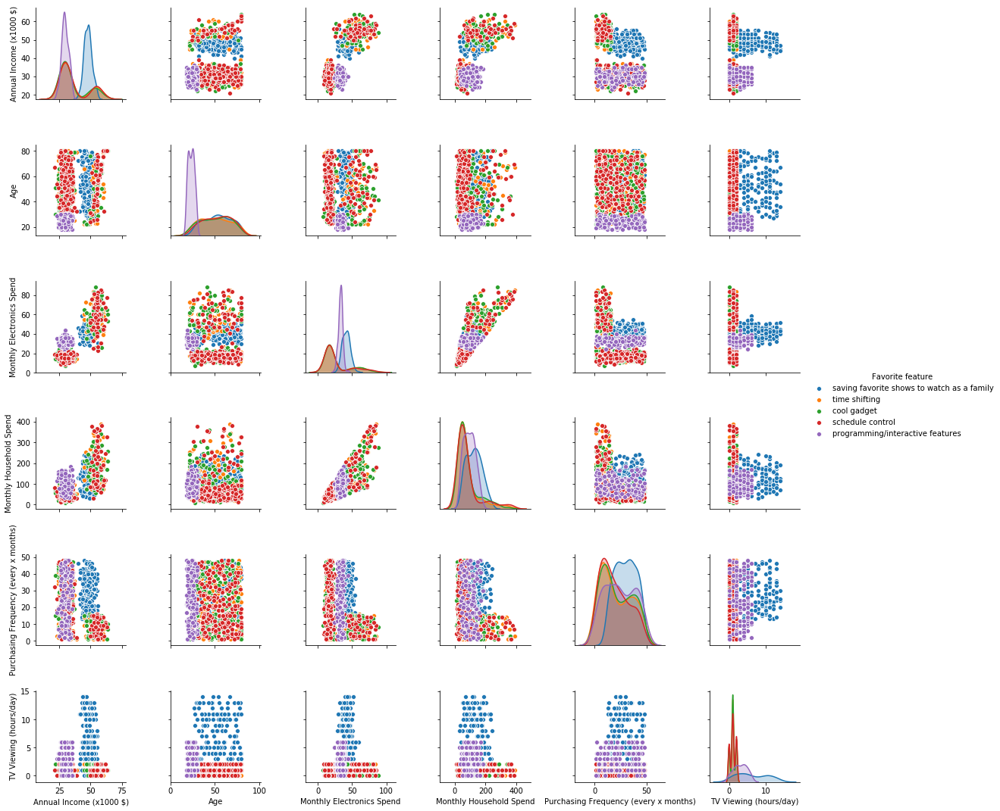

In [22]:
import seaborn as sb

sb.pairplot(dfTx.loc[:, df.columns != 'ID'],hue = "Favorite feature")

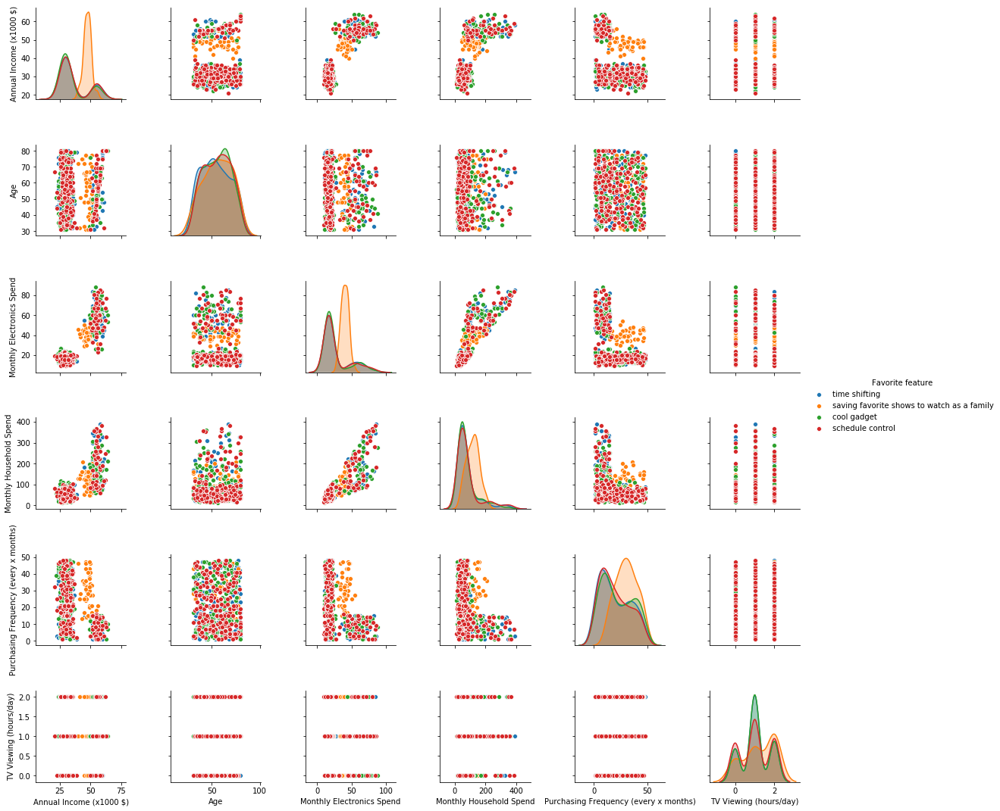

In [23]:
import seaborn as sb

sb.pairplot(ol.loc[:, df.columns != 'ID'],hue = "Favorite feature")

In [24]:
dfTx = df.drop(df.index[440])
dfTx = dfTx.drop(dfTx.index[921])
dfTx.head()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,male,married,professional,none,49.0,30.0,Florida,family,mass-consumer electronics,35.0,150.0,13.0,late,2.0,saving favorite shows to watch as a family
1,2.0,male,single,none,none,46.0,36.0,Alabama,single,mass-consumer electronics,35.0,163.0,26.0,late,10.0,saving favorite shows to watch as a family
2,3.0,male,married,professional,BA,58.0,66.0,Massachusetts,family,specialty stores,64.0,103.0,13.0,early,0.0,time shifting
3,4.0,male,married,none,PhD,51.0,78.0,New York,family,mass-consumer electronics,33.0,154.0,22.0,late,5.0,saving favorite shows to watch as a family
4,5.0,female,single,none,none,46.0,52.0,Montana,single,mass-consumer electronics,45.0,161.0,47.0,late,2.0,saving favorite shows to watch as a family


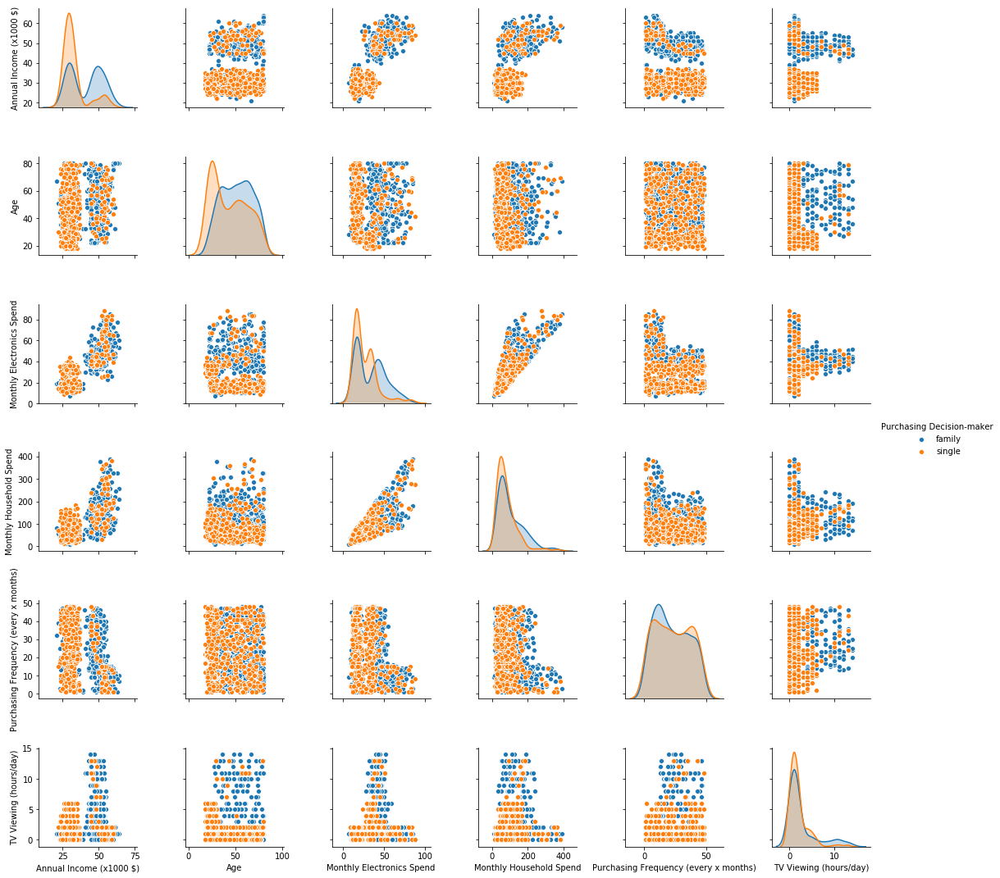

In [25]:
import seaborn as sb

sb.pairplot(dfTx.loc[:, df.columns != 'ID'],hue = "Purchasing Decision-maker")

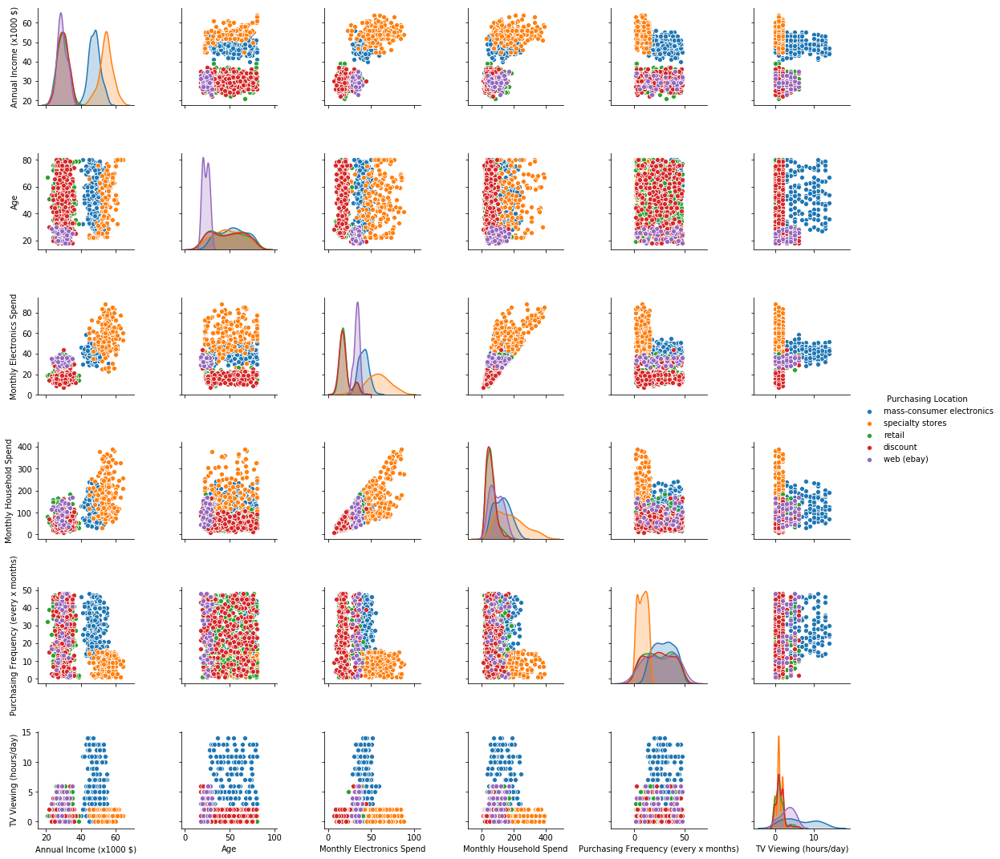

In [26]:
import seaborn as sb

sb.pairplot(dfTx.loc[:, df.columns != 'ID'],hue = "Purchasing Location")

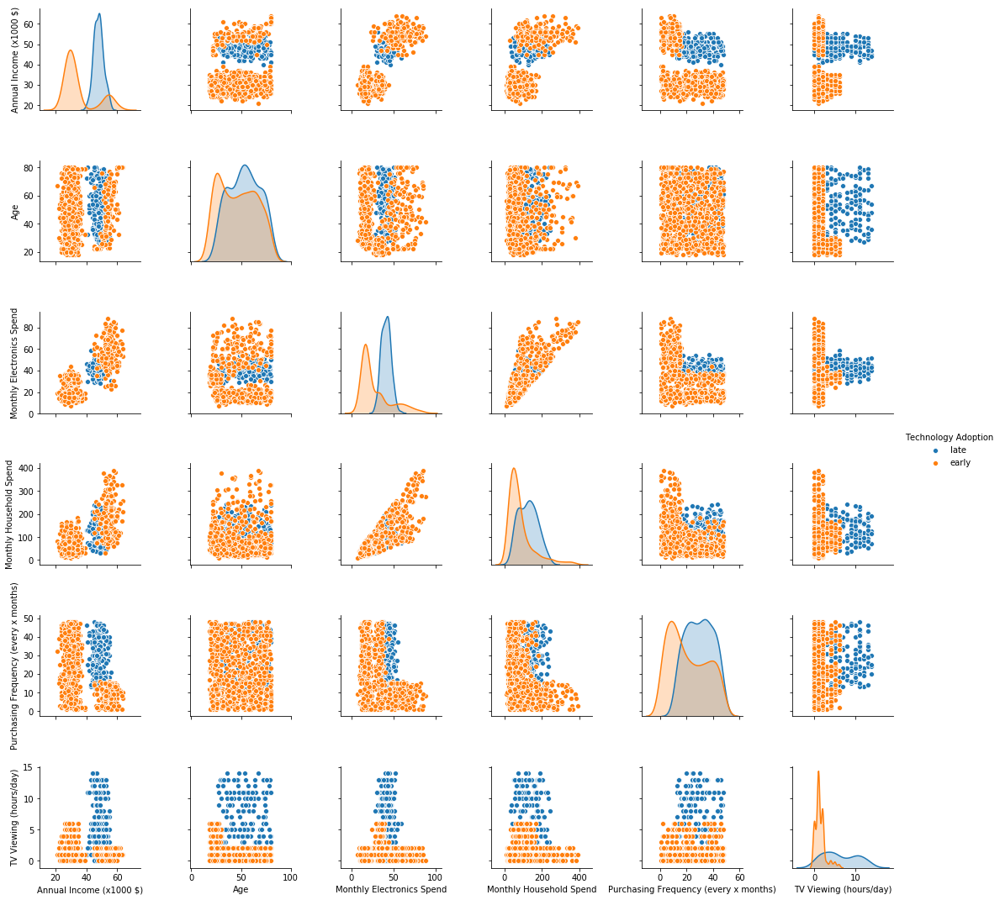

In [27]:
import seaborn as sb

sb.pairplot(dfTx.loc[:, df.columns != 'ID'],hue = "Technology Adoption")

### more obs
- wow income gap around 40k

#### + hues
- higher income tends to like saving shows
    - lower income tends to like programming/ interactive features
- generally every income likes schedule control tho: steady feature

- generally seems to be between the three features: saving fav shows/ schedules control/ programming featrrues
- TV Viewing and fav feature seems to correlate
    - high TV viewing people like saving fav shows to watch as a family
    - low TV viewing people like schedule control
    - mid tv viewing like schedule control
- purchasing frequency sort of increases w tv viewing as well
- monthly household/electronics spend only higher for low tv viewing people tho (scedule control)
- WOW age and tv viewing is clean
    - young and low tv ppl like programming/ interactive features
    - older low viewing ppl like schedule control
    - ppl above 30 all seem to like saving shows to watch as fam and have highest tv watching
household/electronics spend: schedule control - programming/interactive features - saving fav shows
purchasing frequency higher for saving facv shows
only younng people like programming interactive features

**tv viewing and age seems to be best segmentation**
   
    

    



In [28]:
#dfSeg = dfTx
#dfSeg.groupby(['Monthly Electronics Spend']).groups.keys()

In [29]:
# dfSeg = dfTx
#dfSeg["Annual Income (x1000 $)"] = dfSeg["Annual Income (x1000 $)"].replace({21: "low", 22: "low", 23: "low", 24: "low", 25: "low", 26: "low", 27: "low", 28: "low", 29: "low", 30:"low",31:"low",32:"low",33:"low",34:"high",35:"high",36:"high",37:"high",38:"high",39:"high",40:"high",41:"high",42:"high",43:"high",44:"high",45:"high",46:"high",47:"high",48:"high",49:"high",50:"high",51:"high",52:"high",53:"high",54:"high",55:"high",56:"high",57:"high",58:"high",59:"high",60:"high",61:"high",62:"high",63:"high",64:"high"})
#dfSeg["Monthly Electronics Spend"] = dfSeg["Annual Income (x1000 $)"].replace({7: "low", 8: "low", 9: "low", 10: "low", 11: "low", 12: "low", 13: "low", 14: "low", 15: "low", 16:"low",17:"low",18:"low",19:"low",20:"low",21:"low", 22:"low", 23:"low", 24:"low",25:"low",26:"high",27:"high",28:"high",29:"high",30:"high",31:"high",32:"high",33:"high",34:"high", 35:"high",36:"high",37:"high",38:"high",39:"high",40:"high",41:"high",42:"high",43:"high",44:"high",45:"high",46:"high",47:"high",48:"high",49:"high",50:"high",51:"high",52:"high",53:"high",54:"high",55:"high",56:"high",57:"high",58:"high",59:"high",60:"high",61:"high",62:"high",63:"high",64:"high",65:"high",66:"high",67:"high",68:"high",69:"high",70:"high",71:"high",72:"high",73:"high",74:"high",75:"high",76:"high",77:"high",78:"high",79:"high",80:"high",81:"high",82:"high",83:"high",84:"high",85:"high",86:"high",87:"high",88:"high",89:"high"})
#dfSeg.head()

# why did i do this

### obs obs
- gap in monthly electronics spend matching gap in annual income
- why did i plot categorical data against categorical data thats dumb -_____-

# segmentation by VP

In [30]:
vp1 = df.loc[(df["Favorite feature"] == "saving favorite shows to watch as a family")]
import seaborn as sb
vp1.head()

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
0,1.0,male,married,professional,none,49.0,30.0,Florida,family,mass-consumer electronics,35.0,150.0,13.0,late,2.0,saving favorite shows to watch as a family
1,2.0,male,single,none,none,46.0,36.0,Alabama,single,mass-consumer electronics,35.0,163.0,26.0,late,10.0,saving favorite shows to watch as a family
3,4.0,male,married,none,PhD,51.0,78.0,New York,family,mass-consumer electronics,33.0,154.0,22.0,late,5.0,saving favorite shows to watch as a family
4,5.0,female,single,none,none,46.0,52.0,Montana,single,mass-consumer electronics,45.0,161.0,47.0,late,2.0,saving favorite shows to watch as a family
11,12.0,female,married,none,none,49.0,57.0,Florida,family,mass-consumer electronics,46.0,225.0,20.0,late,5.0,saving favorite shows to watch as a family


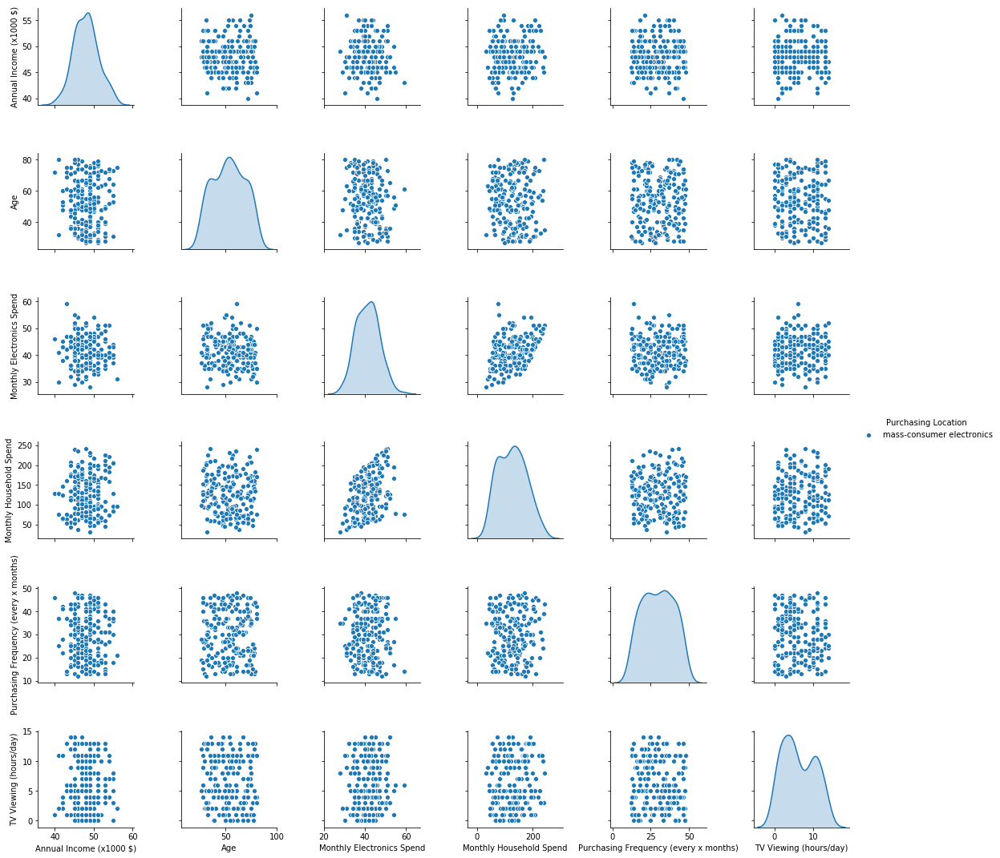

In [31]:
sb.pairplot(vp1.loc[:, vp1.columns != 'ID'],hue = "Purchasing Location")

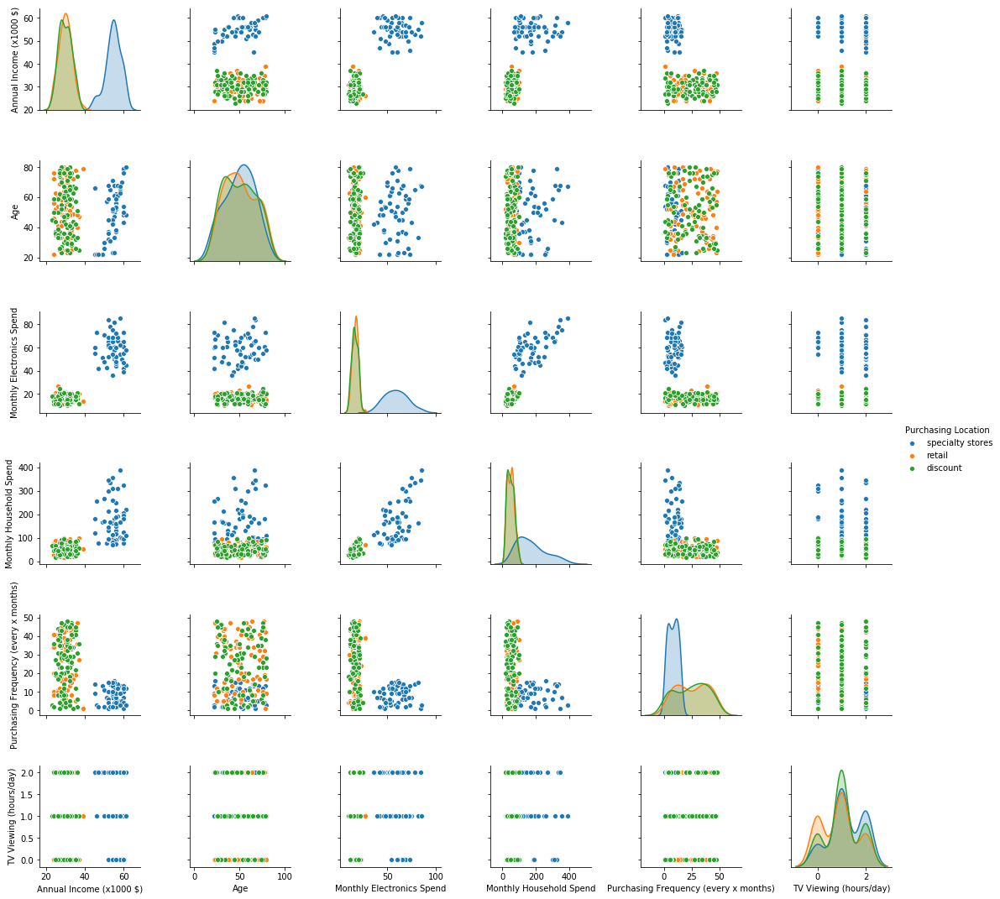

In [32]:
vp2 = df.loc[(df["Favorite feature"] == "time shifting")]
import seaborn as sb

sb.pairplot(vp2.loc[:, vp2.columns != 'ID'],hue = "Purchasing Location")

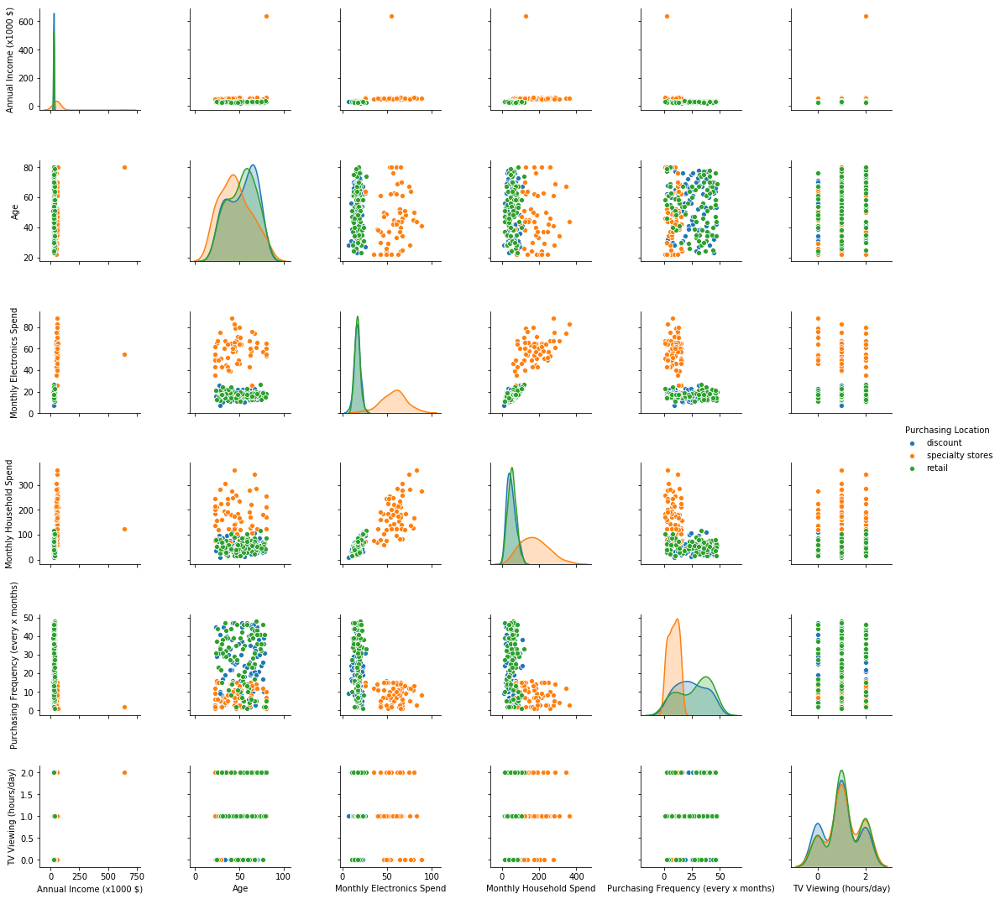

In [33]:
vp3 = df.loc[(df["Favorite feature"] == "cool gadget")]
import seaborn as sb

sb.pairplot(vp3.loc[:, vp3.columns != 'ID'],hue = "Purchasing Location")

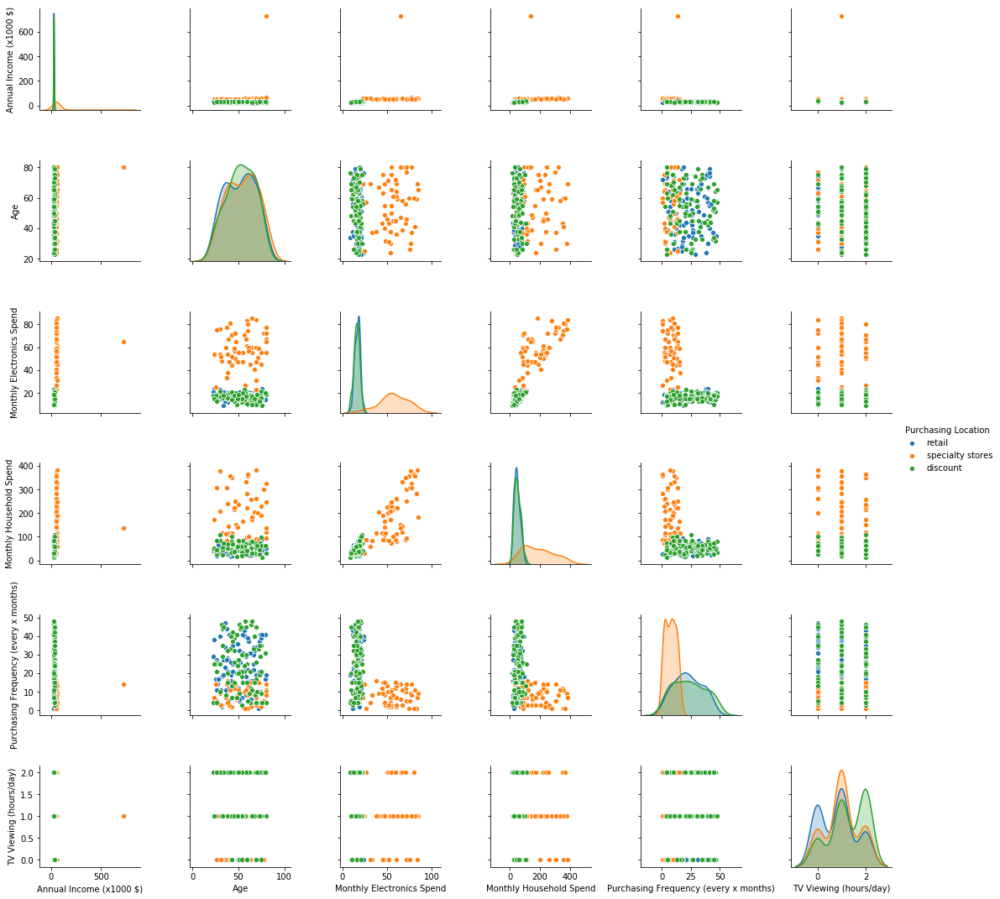

In [34]:
vp4 = df.loc[(df["Favorite feature"] == "schedule control")]
import seaborn as sb

sb.pairplot(vp4.loc[:, vp1.columns != 'ID'],hue = "Purchasing Location")

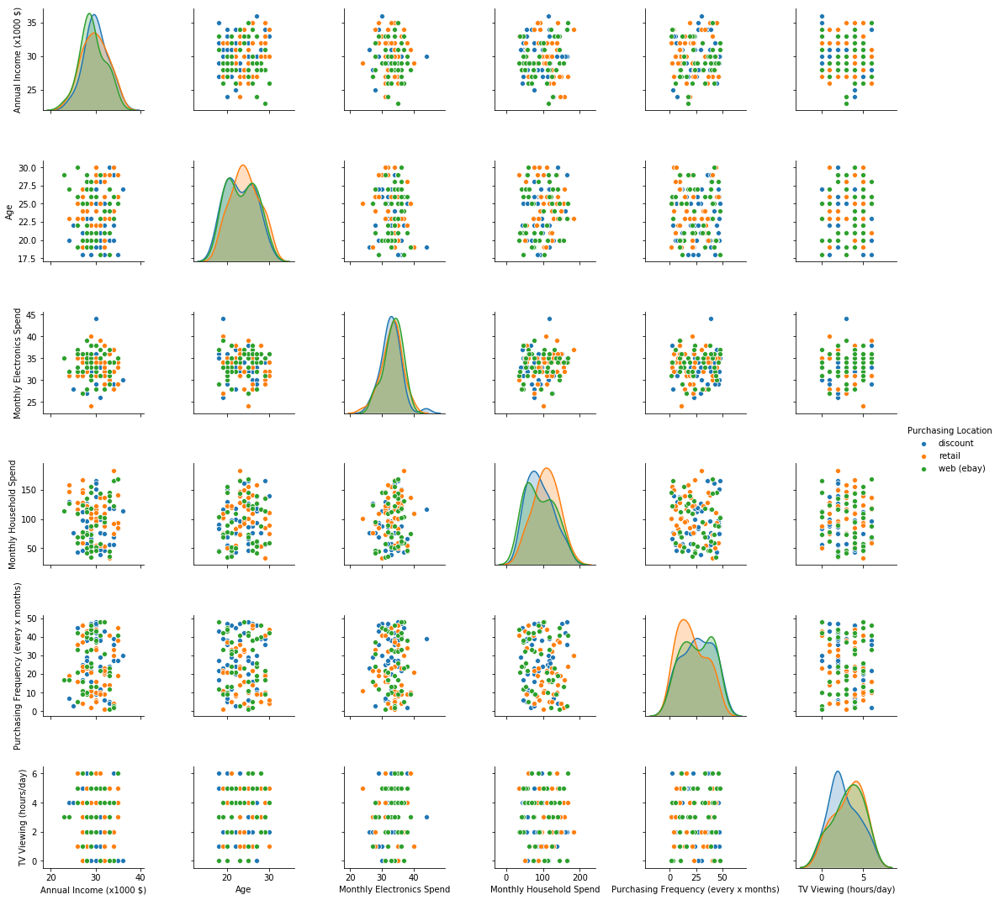

In [35]:
vp5 = df.loc[(df["Favorite feature"] == "programming/interactive features")]
import seaborn as sb

sb.pairplot(vp5.loc[:, vp5.columns != 'ID'],hue = "Purchasing Location")

# Segmentation by Purchasing Location

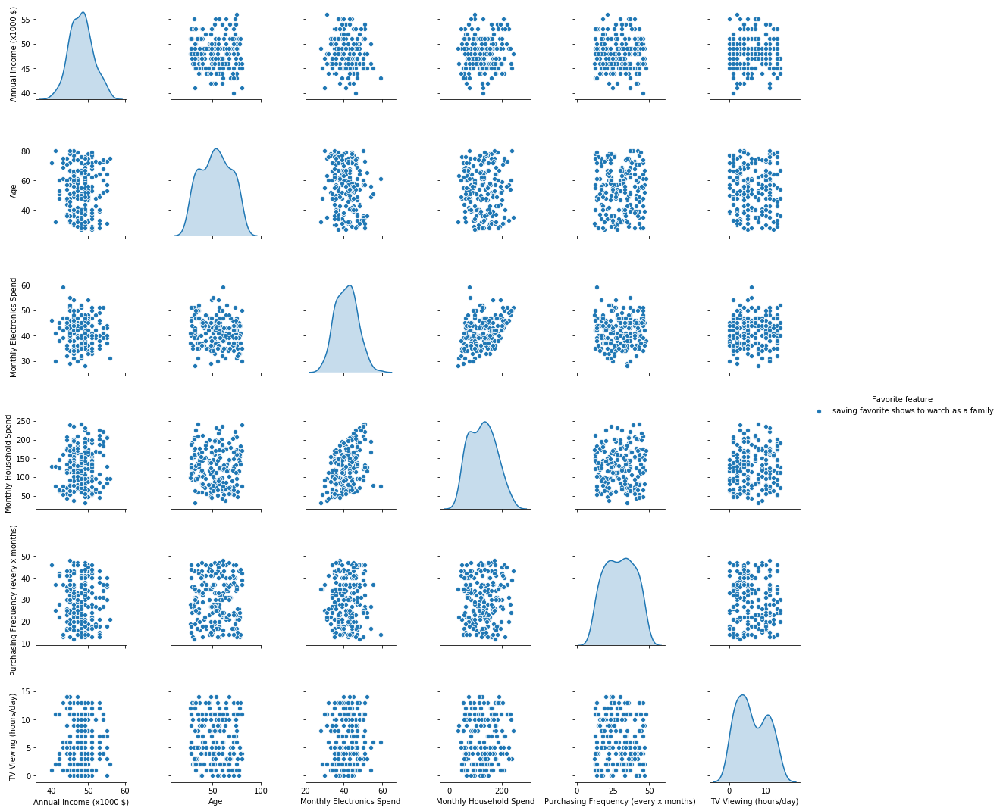

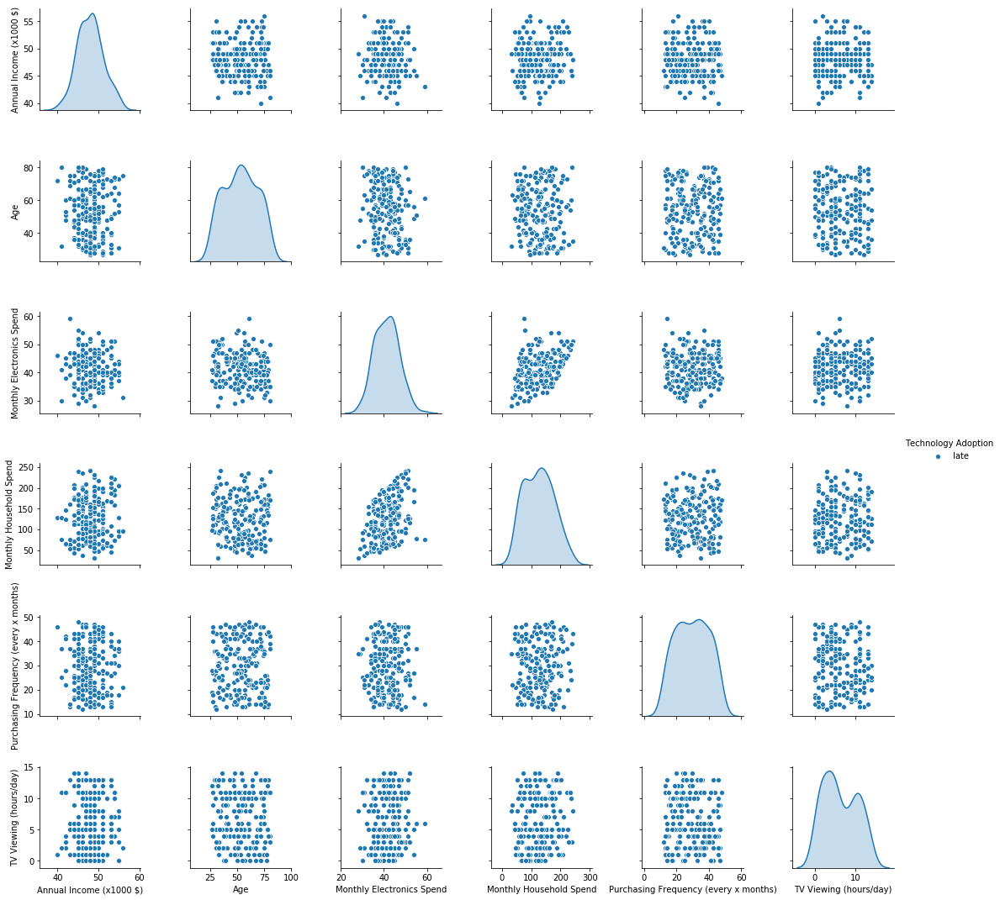

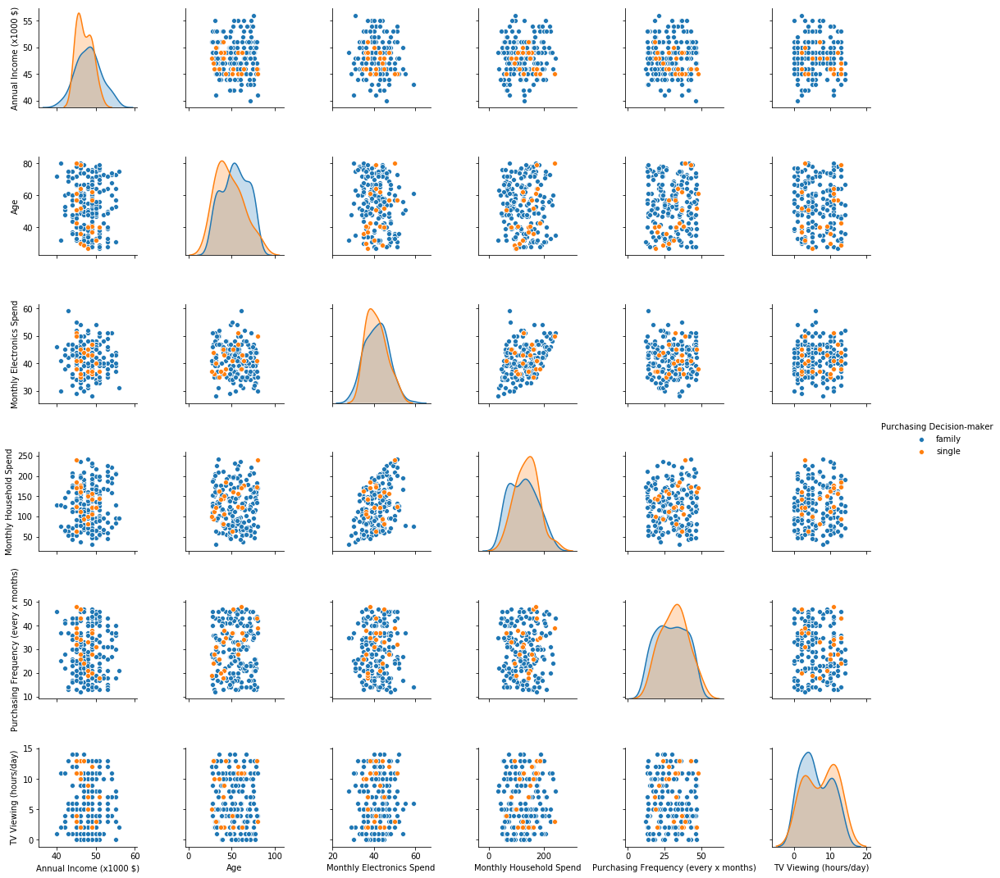

In [78]:
p1 = df.loc[(df["Purchasing Location"] == "mass-consumer electronics")]
import seaborn as sb

sb.pairplot(p1.loc[:, p1.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(p1.loc[:, p1.columns != 'ID'],hue = "Technology Adoption")
sb.pairplot(p1.loc[:, p1.columns != 'ID'],hue = "Purchasing Decision-maker")

count    200.000000
mean      41.405000
std        5.605182
min       28.000000
25%       37.000000
50%       41.000000
75%       45.000000
max       59.000000
Name: Monthly Electronics Spend, dtype: float64


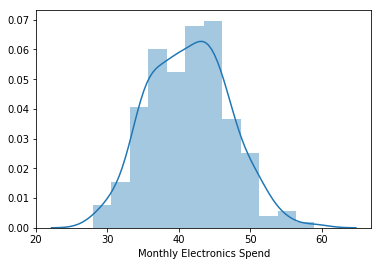

In [37]:
print(p1["Monthly Electronics Spend"].describe())
sb.distplot(p1["Monthly Electronics Spend"])

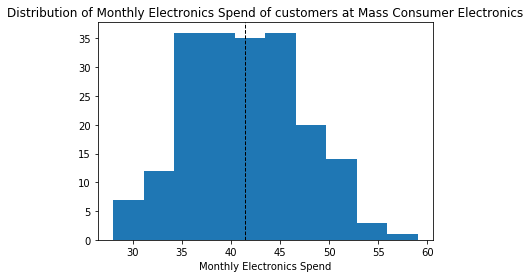

In [38]:
plt.hist(p1["Monthly Electronics Spend"])
plt.title("Distribution of Monthly Electronics Spend of customers at Mass Consumer Electronics")
plt.xlabel("Monthly Electronics Spend")

plt.axvline(p1["Monthly Electronics Spend"].mean(), color='k', linestyle='dashed', linewidth=1)

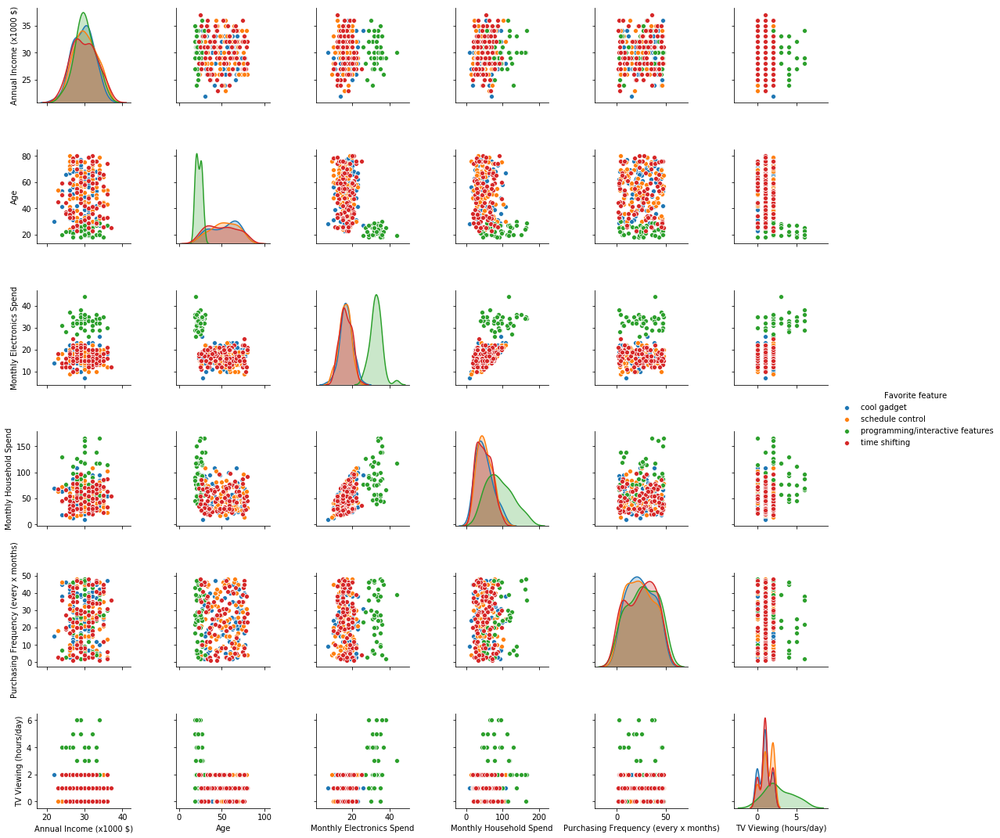

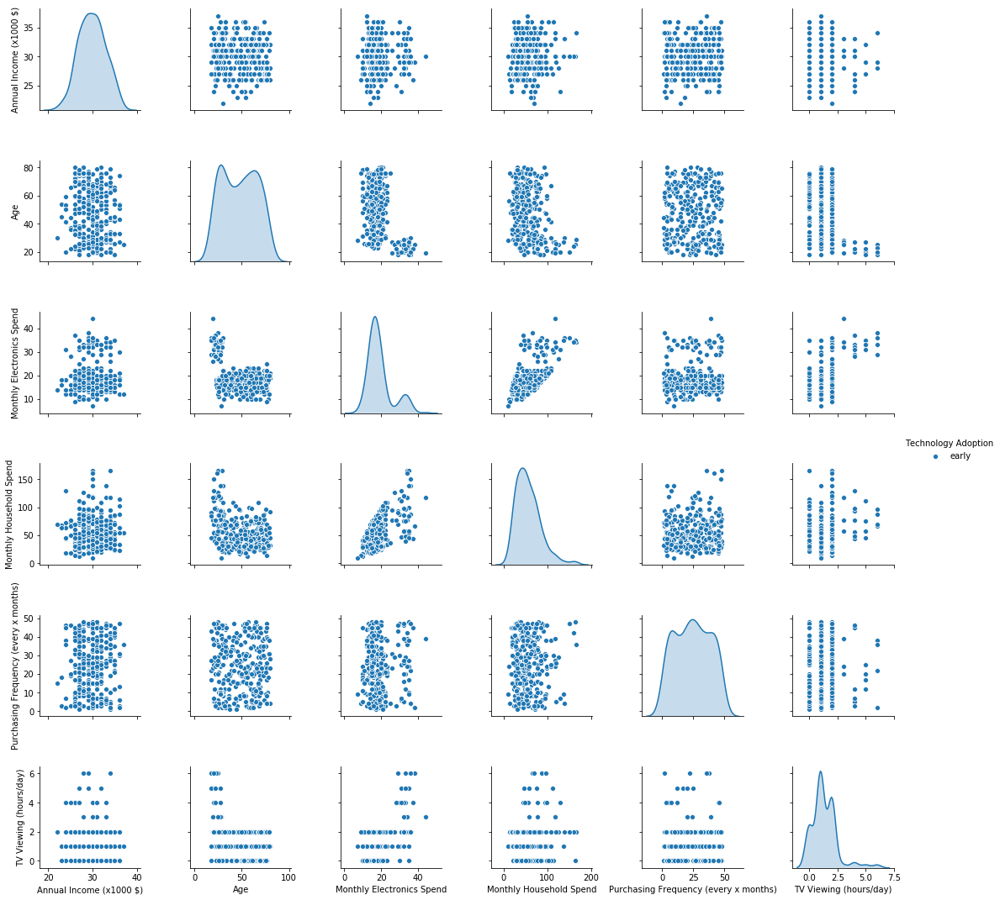

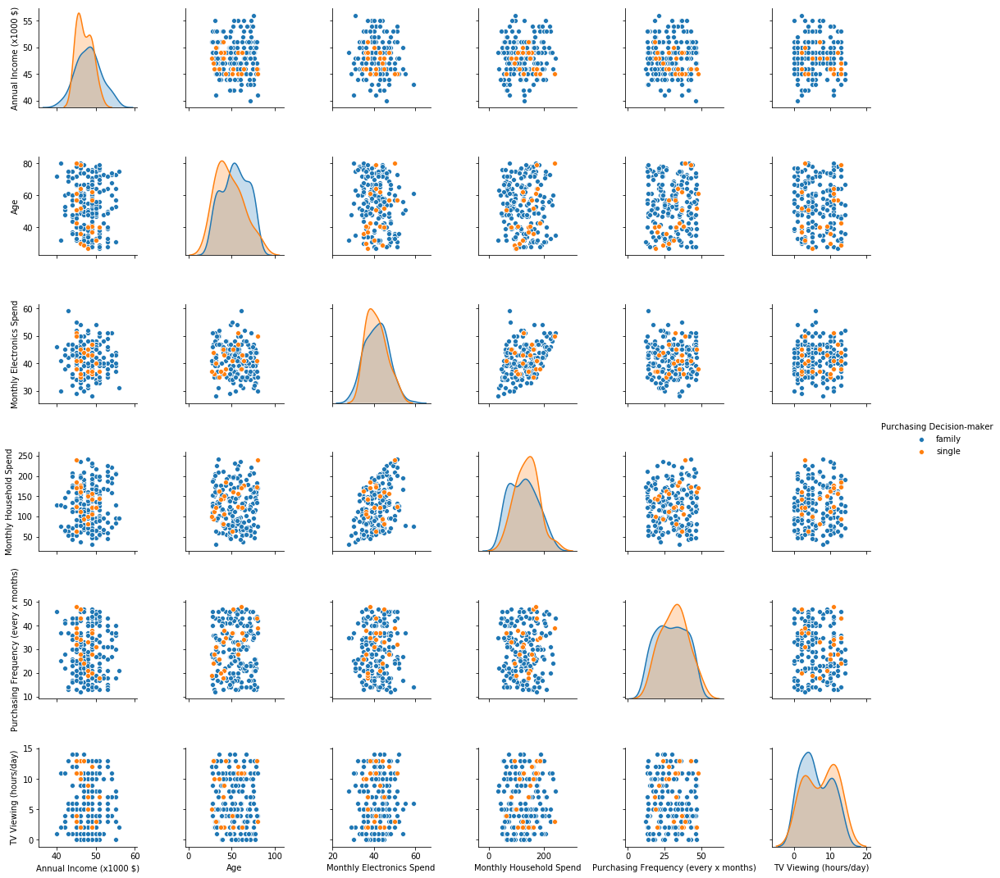

In [79]:
p2 = df.loc[(df["Purchasing Location"] == "discount")]
import seaborn as sb

sb.pairplot(p2.loc[:, p2.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(p2.loc[:, p2.columns != 'ID'],hue = "Technology Adoption")
sb.pairplot(p1.loc[:, p1.columns != 'ID'],hue = "Purchasing Decision-maker")

cool gadget                         0.342629
time shifting                       0.334661
schedule control                    0.318725
programming/interactive features    0.003984
Name: Favorite feature, dtype: float64
programming/interactive features    1.0
Name: Favorite feature, dtype: float64


ValueError: `dataset` input should have multiple elements.

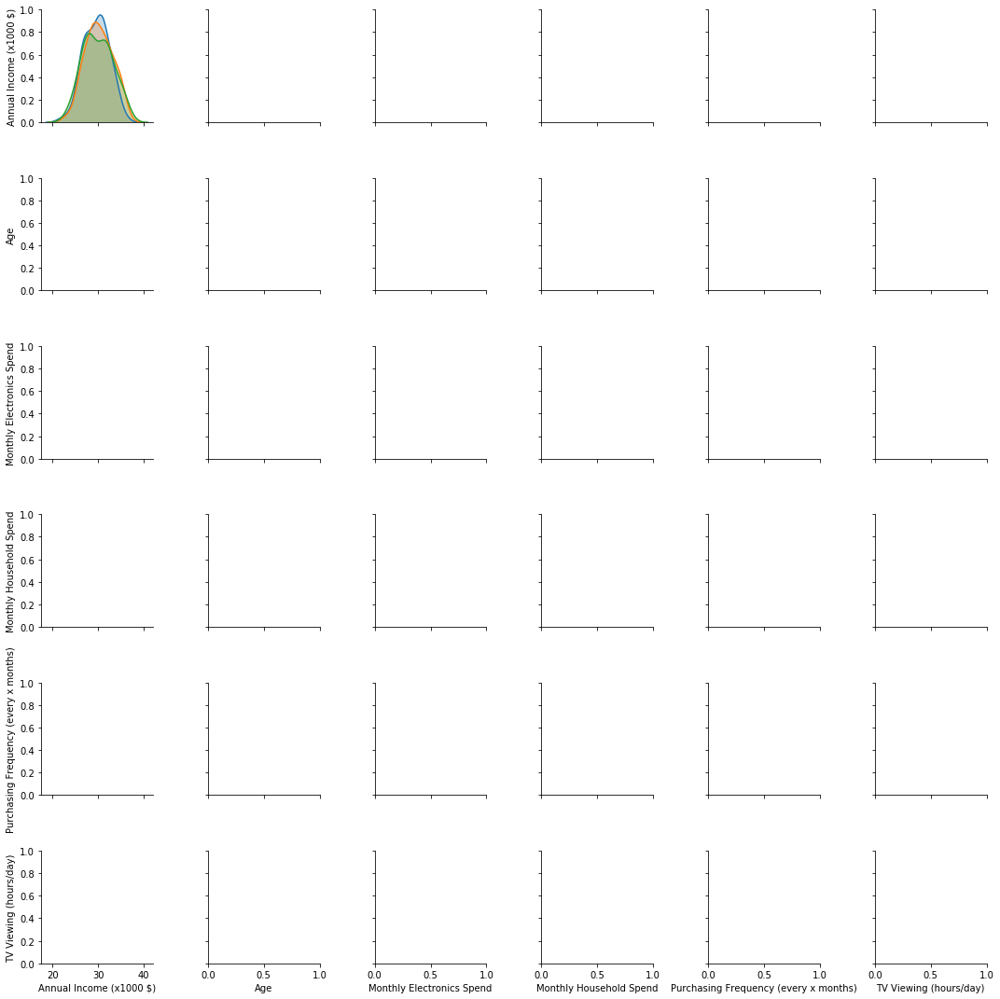

In [40]:
p2_l = p2.loc[(p2["Monthly Electronics Spend"] <= 26)]
p2_h = p2.loc[(p2["Monthly Electronics Spend"] > 26)]
import seaborn as sb

print(p2_l["Favorite feature"].value_counts()/len(p2_l))
print(p2_h["Favorite feature"].value_counts()/len(p2_h))


In [42]:
p2_l[p2_l["Favorite feature"] == "programming/interactive features"]

,ID,Gender,Marital Status,Work Status,Education,Annual Income (x1000 $),Age,Location,Purchasing Decision-maker,Purchasing Location,Monthly Electronics Spend,Monthly Household Spend,Purchasing Frequency (every x months),Technology Adoption,TV Viewing (hours/day),Favorite feature
299,300.0,female,single,professional,BA,31.0,19.0,Connecticut,single,discount,26.0,77.0,23.0,early,2.0,programming/interactive features


In [43]:
# remove outlier (to allow seaborn to work)

p2_l = p2_l[p2_l["Favorite feature"] != "programming/interactive features"]

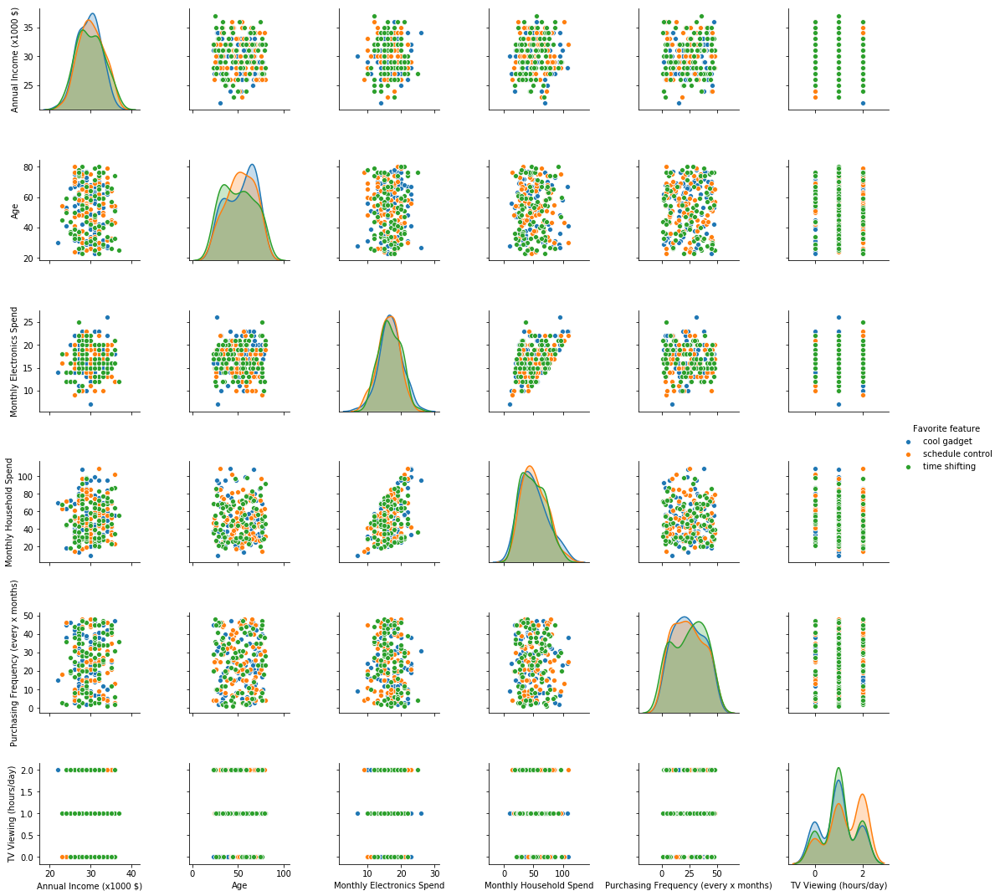

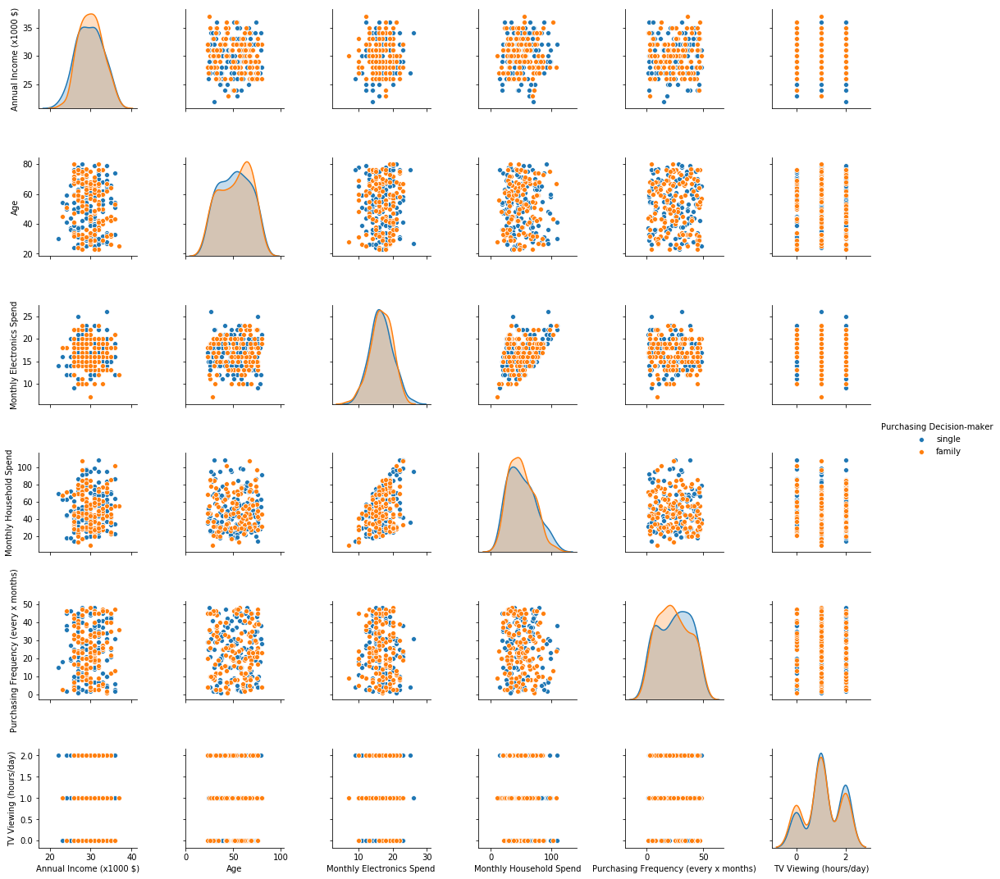

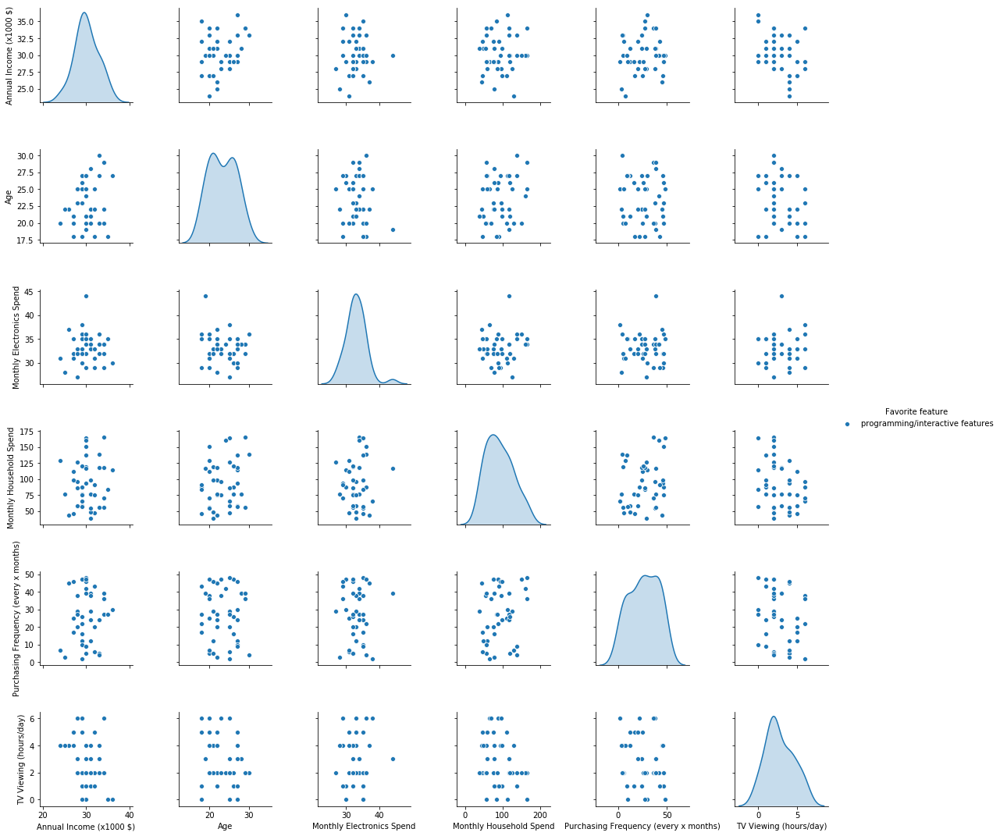

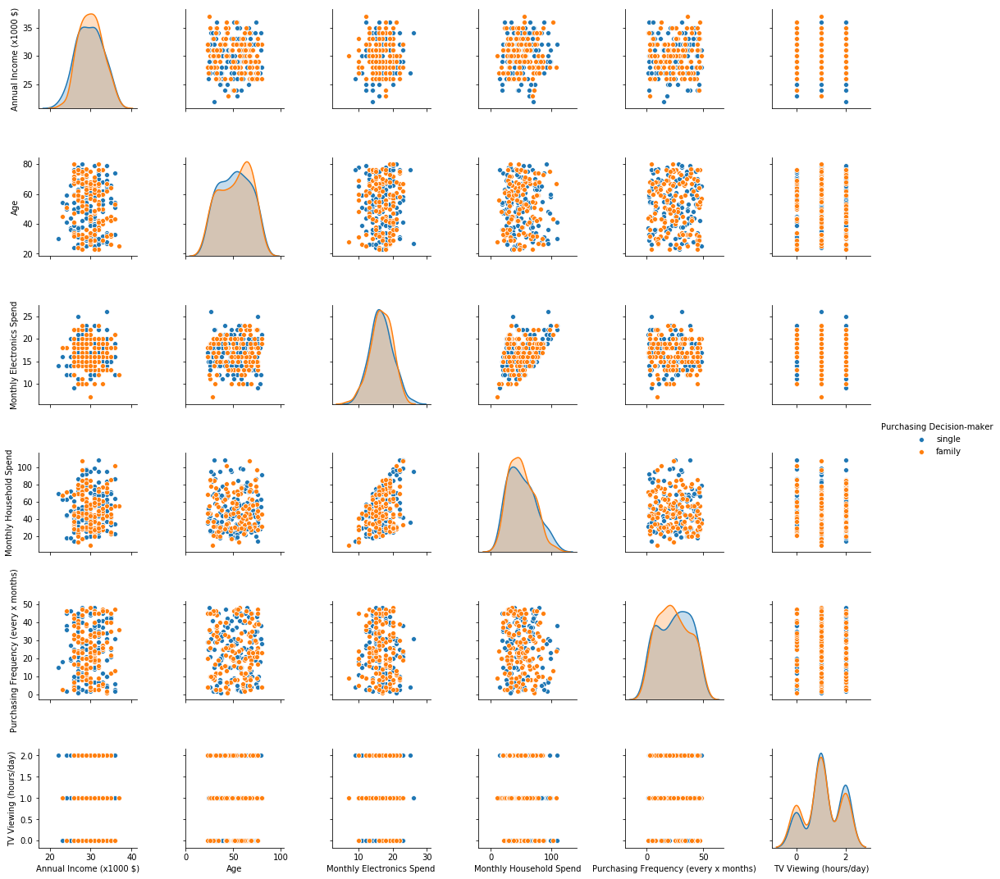

In [82]:

sb.pairplot(p2_l.loc[:, p2_l.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(p2_l.loc[:, p2_l.columns != 'ID'],hue = "Purchasing Decision-maker")
sb.pairplot(p2_h.loc[:, p2_h.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(p2_l.loc[:, p2_h.columns != 'ID'],hue = "Purchasing Decision-maker")

count    250.000000
mean      16.688000
std        3.191142
min        7.000000
25%       15.000000
50%       17.000000
75%       19.000000
max       26.000000
Name: Monthly Electronics Spend, dtype: float64


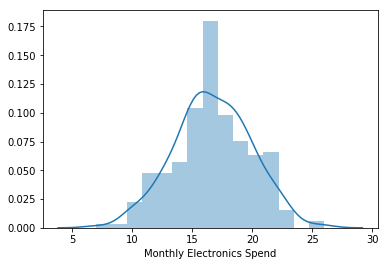

In [48]:
sb.distplot(p2_l["Monthly Electronics Spend"])
print(p2_l["Monthly Electronics Spend"].describe())

count    42.000000
mean     33.095238
std       3.002515
min      27.000000
25%      32.000000
50%      33.000000
75%      35.000000
max      44.000000
Name: Monthly Electronics Spend, dtype: float64


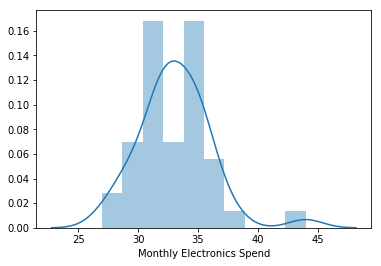

In [49]:
sb.distplot(p2_h["Monthly Electronics Spend"])
print(p2_h["Monthly Electronics Spend"].describe())

In [50]:
p2["Favorite feature"].value_counts()/len(p2)

cool gadget                         0.293515
time shifting                       0.286689
schedule control                    0.273038
programming/interactive features    0.146758
Name: Favorite feature, dtype: float64

Text(0.5,1,'Monthly Electronics Spend Vs Favorite feature')

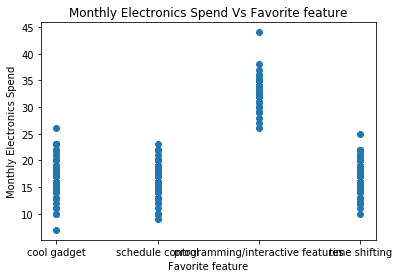

In [51]:
plt.scatter(p2["Favorite feature"],p2["Monthly Electronics Spend"])

plt.xlabel("Favorite feature")
plt.ylabel("Monthly Electronics Spend")
plt.title("Monthly Electronics Spend Vs Favorite feature")

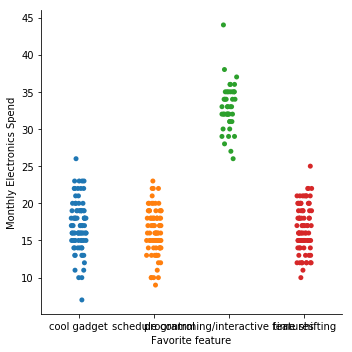

In [52]:
sb.catplot(x="Favorite feature",y="Monthly Electronics Spend",hue="Favorite feature",data=p2)

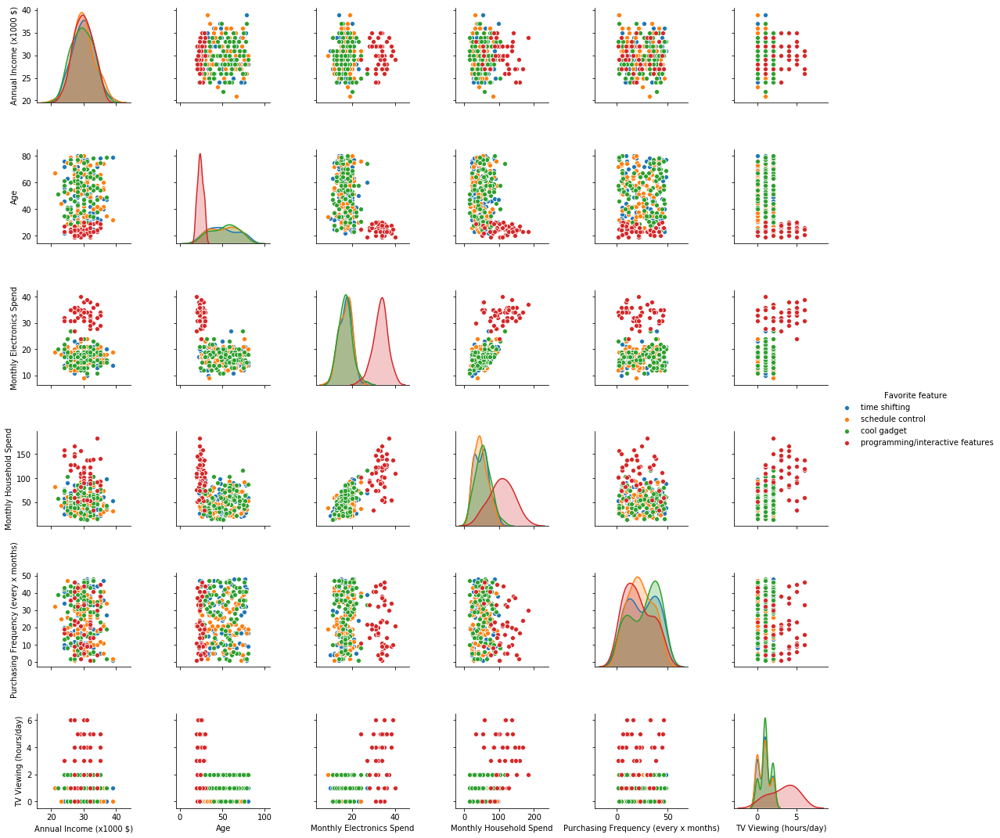

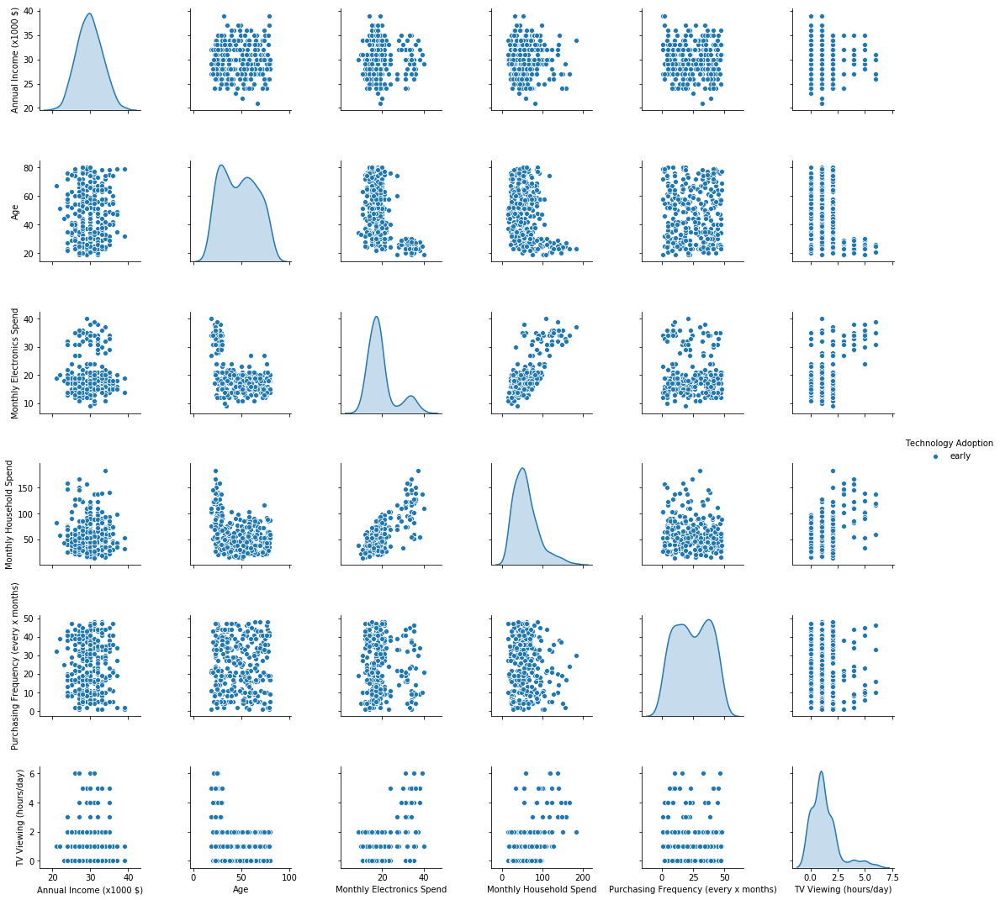

In [53]:
p3 = df.loc[(df["Purchasing Location"] == "retail")]
import seaborn as sb

sb.pairplot(p3.loc[:, p3.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(p3.loc[:, p3.columns != 'ID'],hue = "Technology Adoption")


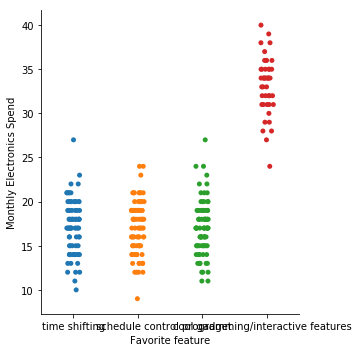

In [54]:
sb.catplot(x="Favorite feature",y="Monthly Electronics Spend",hue="Favorite feature",data=p3)

In [55]:
p3["Favorite feature"].value_counts()/len(p3)

schedule control                    0.289116
cool gadget                         0.285714
time shifting                       0.275510
programming/interactive features    0.149660
Name: Favorite feature, dtype: float64

In [61]:
p3_l = p3.loc[(p3["Monthly Electronics Spend"] <= 26)]
p3_h = p3.loc[(p3["Monthly Electronics Spend"] > 26)]
import seaborn as sb

print(p3_l["Favorite feature"].value_counts())
print(p3_h["Favorite feature"].value_counts())

schedule control                    85
cool gadget                         83
time shifting                       80
programming/interactive features     1
Name: Favorite feature, dtype: int64
programming/interactive features    43
time shifting                        1
cool gadget                          1
Name: Favorite feature, dtype: int64


In [64]:
# clean for seaborn

p3_l = p3_l[p3_l["Favorite feature"] != "programming/interactive features"]
p3_h = p3_h[(p3_h["Favorite feature"] != "time shifting") & (p3_h["Favorite feature"] != "cool gadget")]


In [65]:
print(p3_l["Favorite feature"].value_counts())
print(p3_h["Favorite feature"].value_counts())

schedule control    85
cool gadget         83
time shifting       80
Name: Favorite feature, dtype: int64
programming/interactive features    43
Name: Favorite feature, dtype: int64


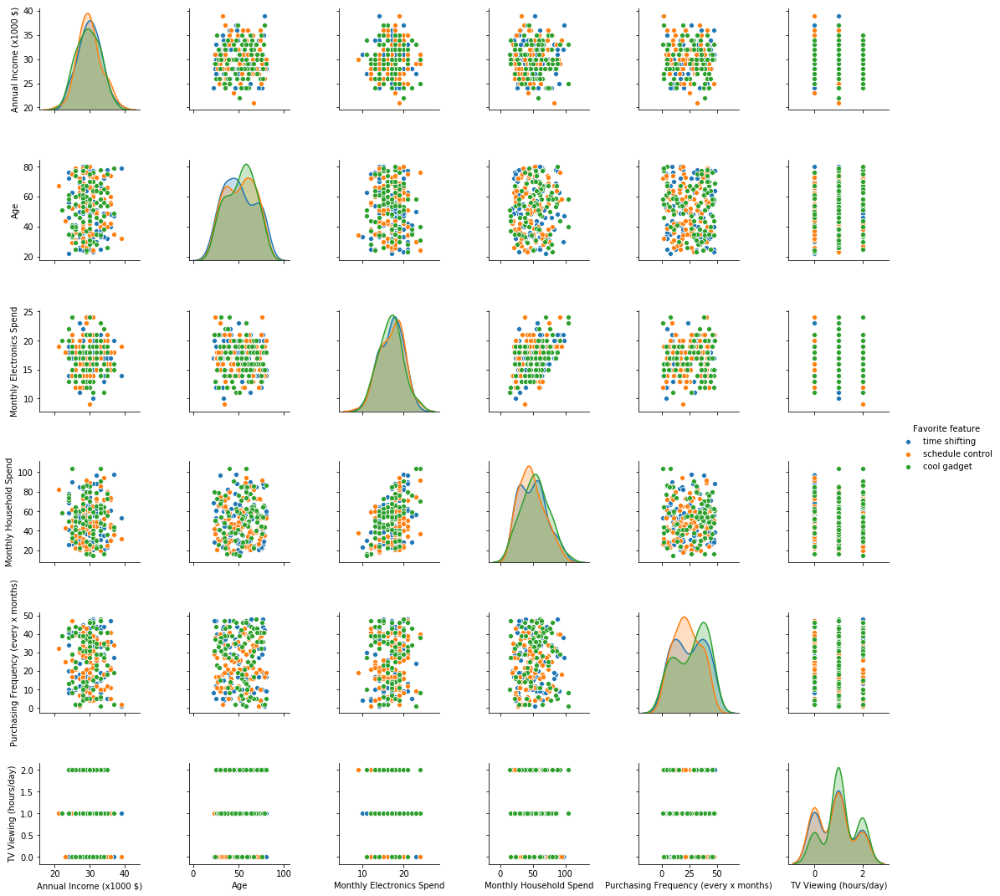

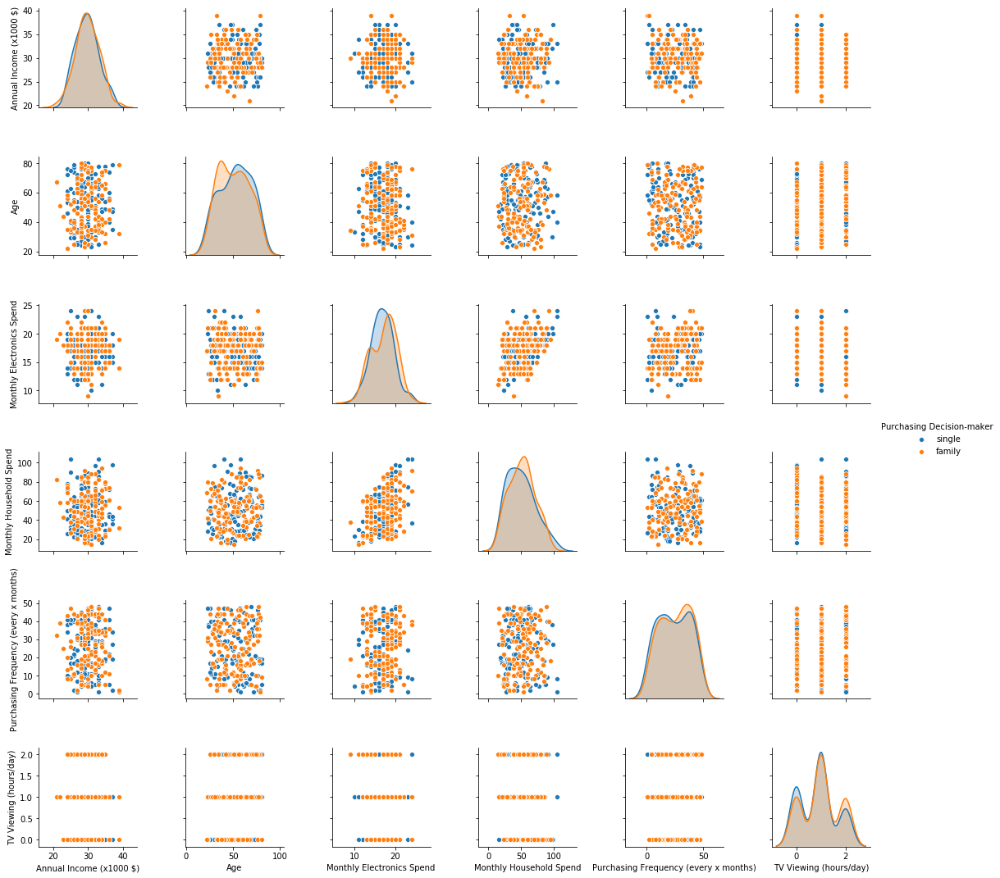

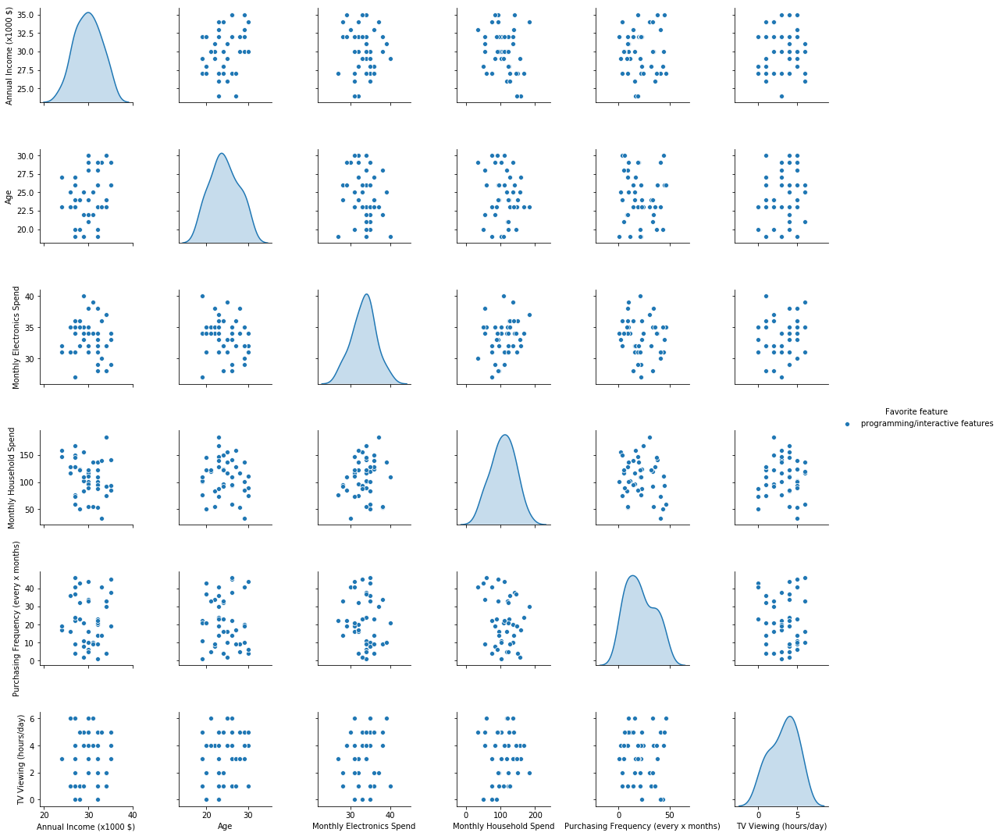

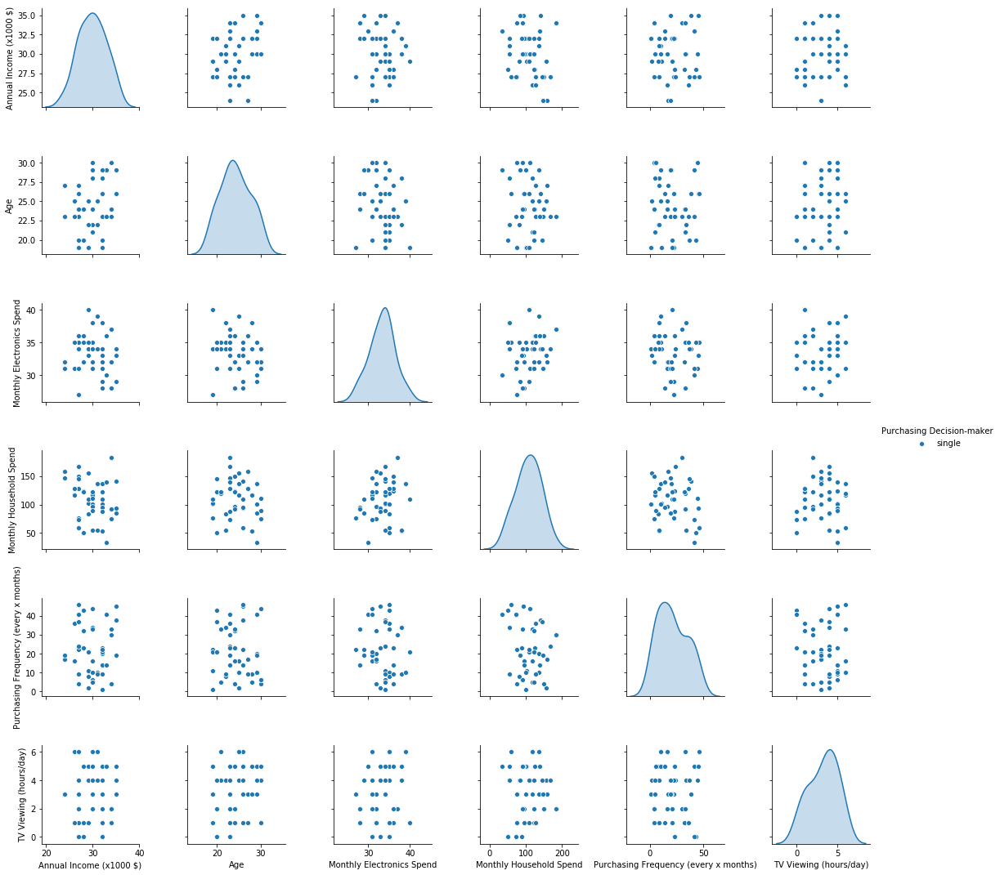

In [83]:
sb.pairplot(p3_l.loc[:, p3_l.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(p3_l.loc[:, p3_l.columns != 'ID'],hue = "Purchasing Decision-maker")
sb.pairplot(p3_h.loc[:, p3_h.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(p3_h.loc[:, p3_h.columns != 'ID'],hue = "Purchasing Decision-maker")

count    248.000000
mean      17.028226
std        2.877247
min        9.000000
25%       15.000000
50%       17.000000
75%       19.000000
max       24.000000
Name: Monthly Electronics Spend, dtype: float64


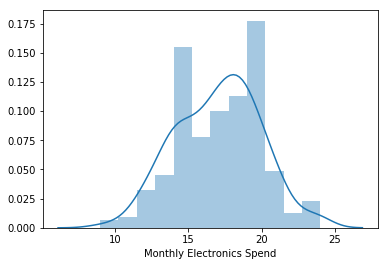

In [67]:
sb.distplot(p3_l["Monthly Electronics Spend"])
print(p3_l["Monthly Electronics Spend"].describe())

count    43.000000
mean     33.418605
std       2.945801
min      27.000000
25%      31.500000
50%      34.000000
75%      35.000000
max      40.000000
Name: Monthly Electronics Spend, dtype: float64


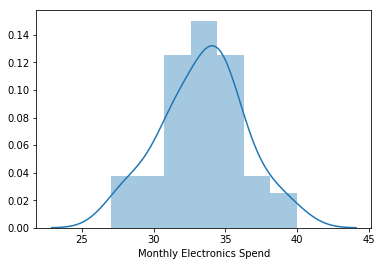

In [68]:
sb.distplot(p3_h["Monthly Electronics Spend"])
print(p3_h["Monthly Electronics Spend"].describe())

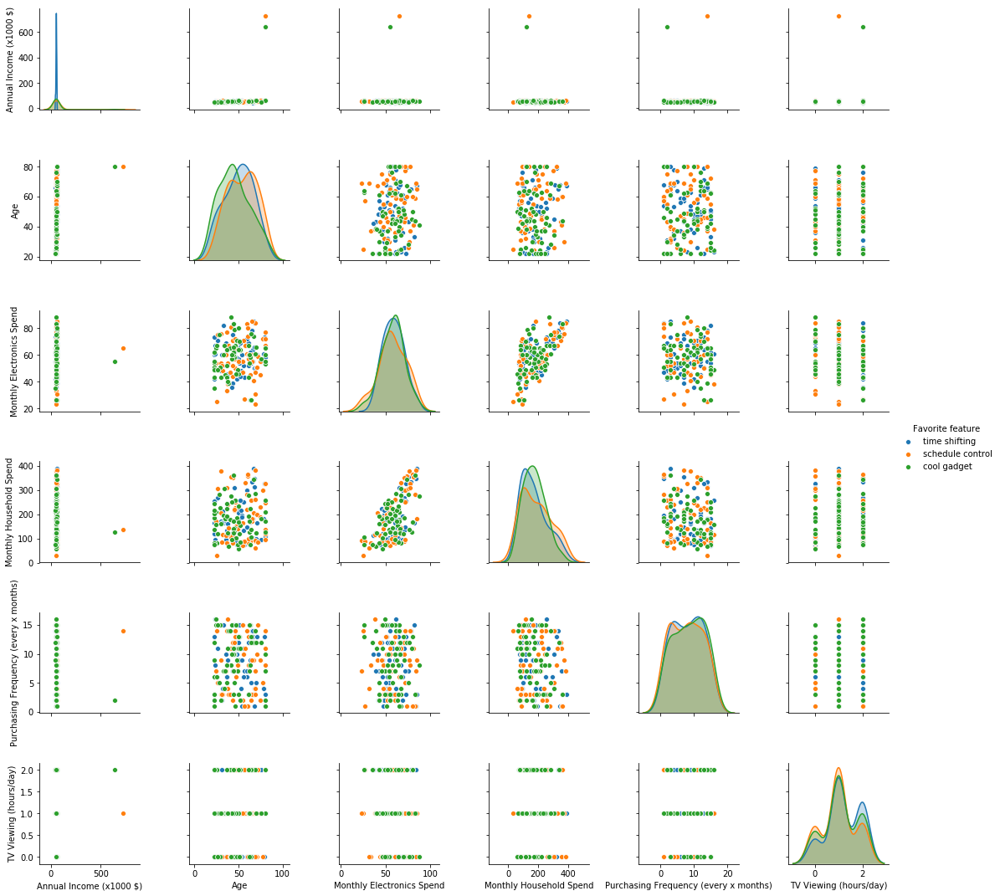

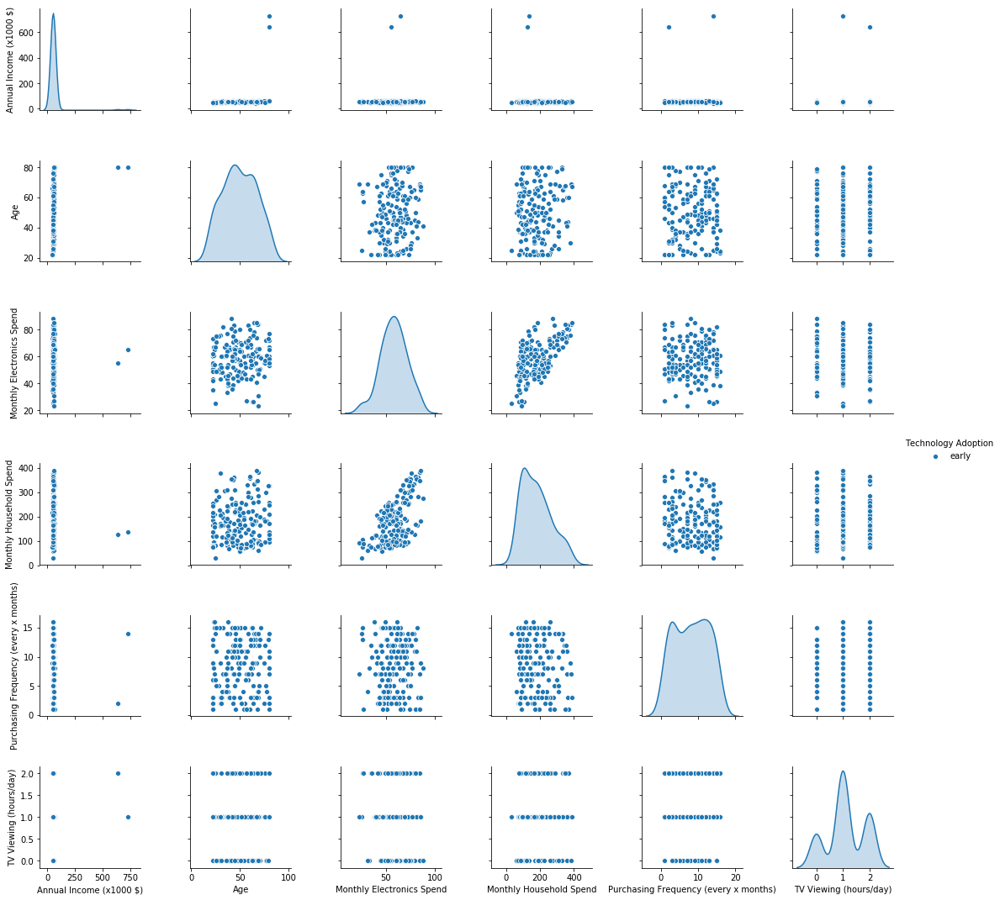

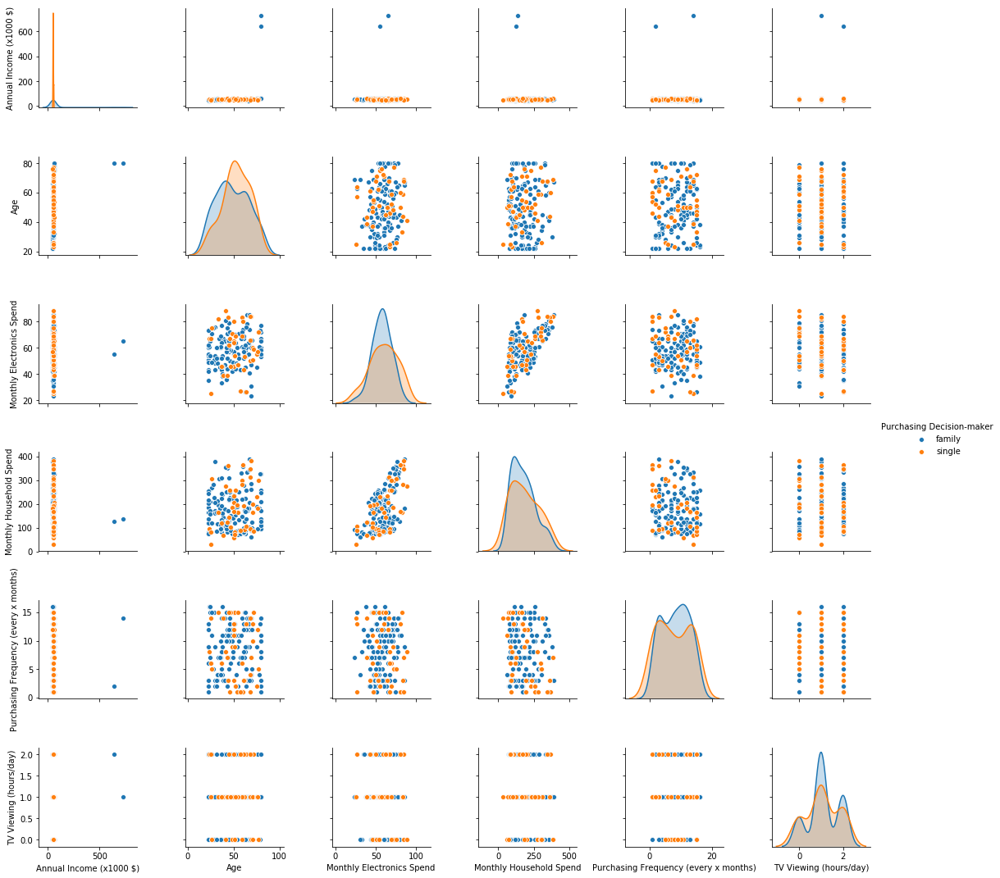

In [84]:
p4 = df.loc[(df["Purchasing Location"] == "specialty stores")]
import seaborn as sb

sb.pairplot(p4.loc[:, p4.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(p4.loc[:, p4.columns != 'ID'],hue = "Technology Adoption")
sb.pairplot(p4.loc[:, p4.columns != 'ID'],hue = "Purchasing Decision-maker")

In [70]:
p4["Favorite feature"].value_counts()/len(p4)

cool gadget         0.341176
schedule control    0.329412
time shifting       0.329412
Name: Favorite feature, dtype: float64

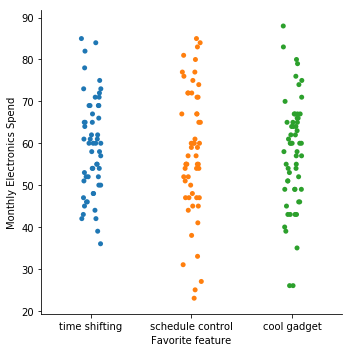

In [71]:
sb.catplot(x="Favorite feature",y="Monthly Electronics Spend",hue="Favorite feature",data=p4)

count    170.000000
mean      58.300000
std       13.252598
min       23.000000
25%       49.250000
50%       59.000000
75%       67.000000
max       88.000000
Name: Monthly Electronics Spend, dtype: float64


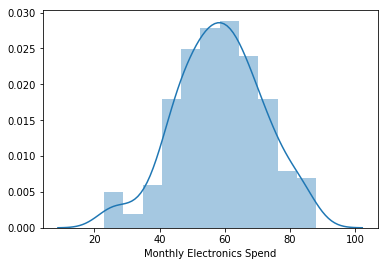

In [73]:
sb.distplot(p4["Monthly Electronics Spend"])
print(p4["Monthly Electronics Spend"].describe())

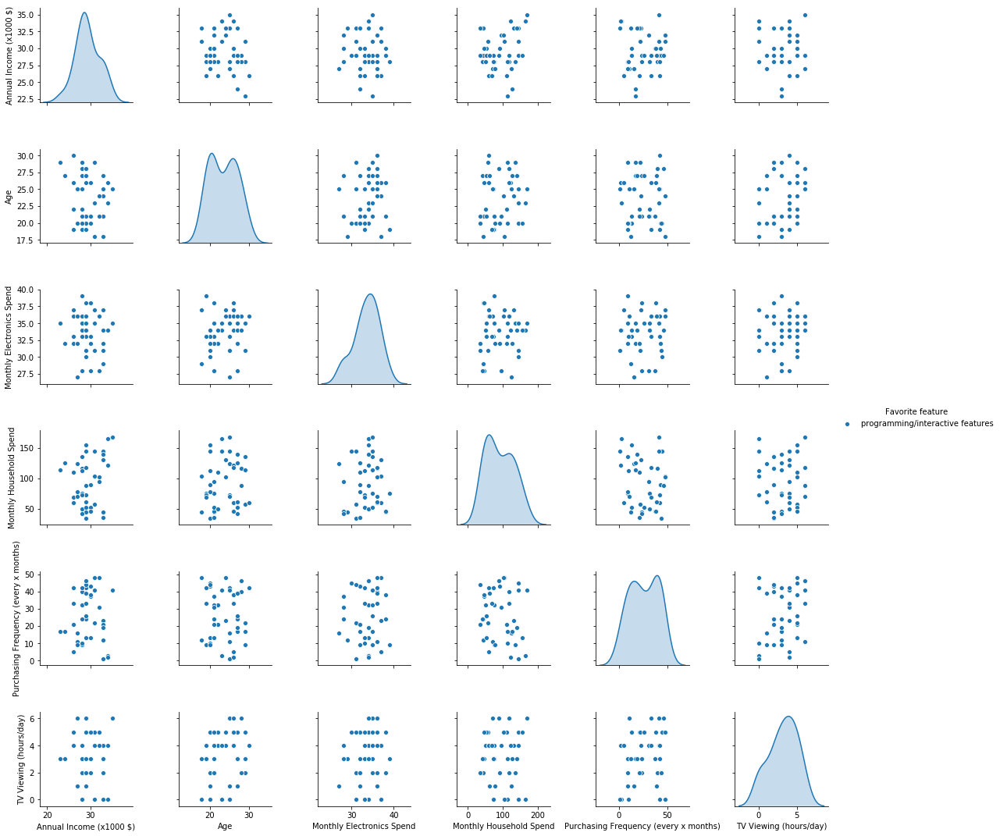

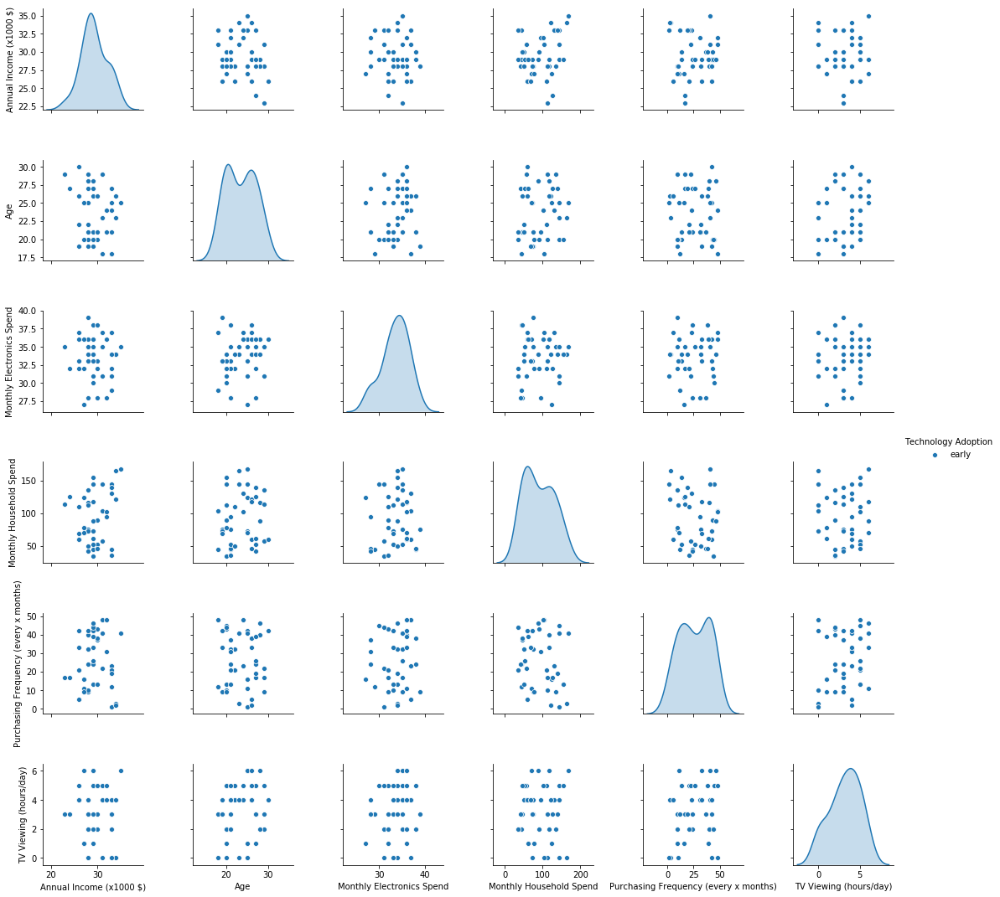

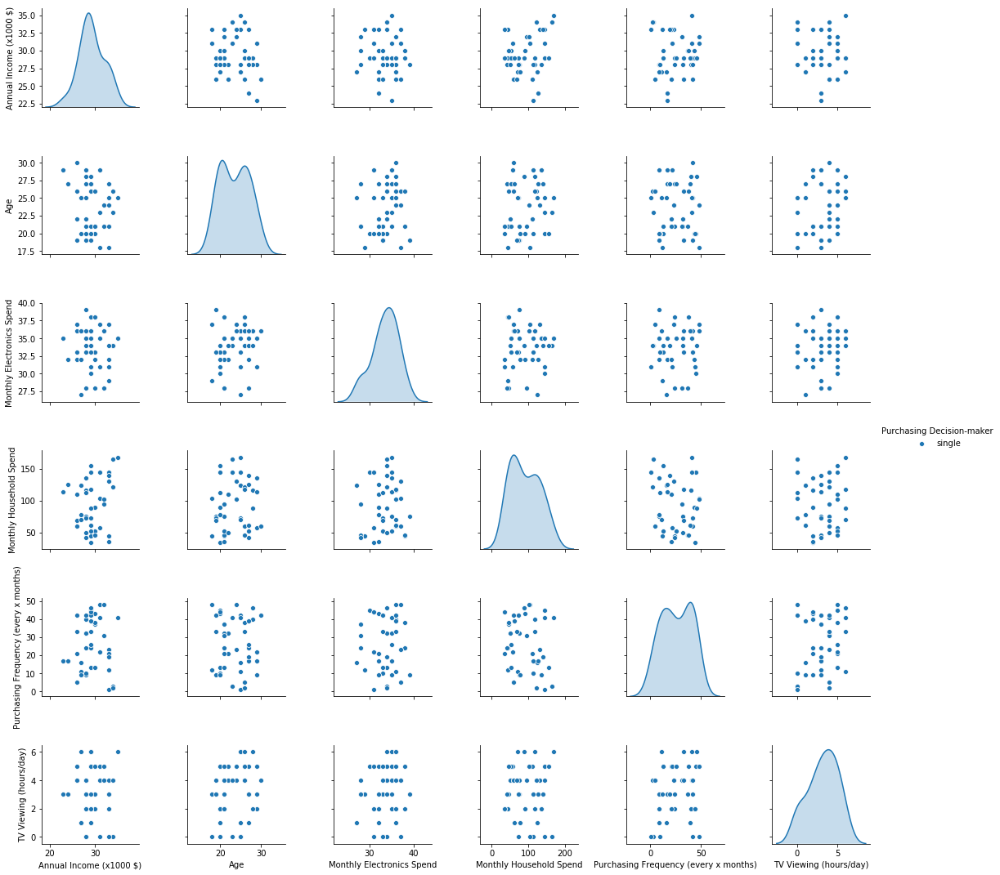

In [85]:
p5 = df.loc[(df["Purchasing Location"] == "web (ebay)")]
import seaborn as sb

sb.pairplot(p5.loc[:, p5.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(p5.loc[:, p5.columns != 'ID'],hue = "Technology Adoption")
sb.pairplot(p5.loc[:, p5.columns != 'ID'],hue = "Purchasing Decision-maker")

count    170.000000
mean      58.300000
std       13.252598
min       23.000000
25%       49.250000
50%       59.000000
75%       67.000000
max       88.000000
Name: Monthly Electronics Spend, dtype: float64


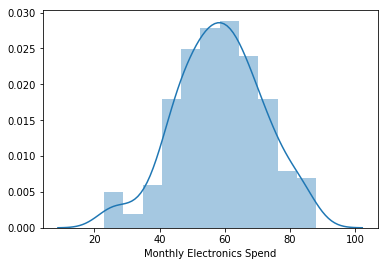

In [76]:
sb.distplot(p4["Monthly Electronics Spend"])
print(p4["Monthly Electronics Spend"].describe())

# age and tv viewing

In [ ]:
yl.head()

In [ ]:
yl["Favorite feature"].value_counts()

In [ ]:
yl[yl["Favorite feature"] == "saving favorite shows to watch as a family"]

In [ ]:
sb.pairplot(data = yl[1:], vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Favorite feature")

In [ ]:
sb.pairplot(data = yl[1:], vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Purchasing Location")

In [ ]:
sb.pairplot(data = yh, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Favorite feature")

In [ ]:
sb.pairplot(data = yh, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Purchasing Location")sb.pairplot(data = yh, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Purchasing Location")

In [ ]:
sb.pairplot(data = ol, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Favorite feature")

In [ ]:
sb.pairplot(data = ol, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Purchasing Location")

In [ ]:
sb.pairplot(data = oh, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Favorite feature")

In [ ]:
sb.pairplot(data = yh, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Purchasing Location")

# segmentation by early vs late

In [ ]:
early = df.loc[(df["Technology Adoption"] == "early")]
sb.pairplot(data = early, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Favorite feature")
sb.pairplot(data = early, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Purchasing Location")

In [ ]:
late = df.loc[(df["Technology Adoption"] == "late")]
sb.pairplot(data = late, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Favorite feature")
sb.pairplot(data = late, vars = ["Annual Income (x1000 $)","Age","Monthly Electronics Spend","TV Viewing (hours/day)"], hue="Purchasing Location")

In [ ]:
#work status and age

yp= df.loc[(df["Age"] <= 30) & (df["Work Status"] == "professional")]
op= df.loc[(df["Age"] > 30) & (df["Work Status"] == "professional")]
yn= df.loc[(df["Age"] <= 30) & (df["Work Status"] == "none")]
on= df.loc[(df["Age"] > 30) & (df["Work Status"] == "none")]


In [ ]:
sb.pairplot(yp.loc[:, yp.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(yp.loc[:, yp.columns != 'ID'],hue = "Purchasing Location")

In [ ]:
sb.pairplot(op.loc[:, op.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(op.loc[:, op.columns != 'ID'],hue = "Purchasing Location")

In [ ]:
yn["Favorite feature"].value_counts()

yn[yn["Favorite feature"]=="saving favorite shows to watch as a family"]
yn = yn[yn["ID"] != 240 ]

In [ ]:
yn["Purchasing Location"].value_counts()
yn[yn["Purchasing Location"]=="mass-consumer electronics"]


In [ ]:
sb.pairplot(yn.loc[:, yn.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(yn.loc[:, yn.columns != 'ID'],hue = "Purchasing Location")

In [ ]:
sb.pairplot(on.loc[:, on.columns != 'ID'],hue = "Favorite feature")
sb.pairplot(on.loc[:, on.columns != 'ID'],hue = "Purchasing Location")